# Objectif 

Date de création : 06/04/2026

Illustration de la sensibilité de la distance $\theta$ utilisé à l'aide d'un exemple très simple dans un guide d'onde idéal. 

## Cadre de l'étude 

* Antenne HLA de deux capteurs, immersion fixe $z_a = 50$ m.
* Source d'immersion fixe $z_s = 5$ m, distance au capteur de référence r variable. 
* Environnement : guide d'onde idéal (fond parfaitement solide), profondeur $D_w = 100$ m. 

## Approche 

L'immersion de la source est fixée à $z_s = 5$ m, la distance $r$ de la source au capteur de référence (capteur 1) varie dans un intervalle $I_r$, 

$$ I_r = [r_{ref} - \Delta_r, r_{ref} + \Delta_r] $$ 

** Définition du RTF 
$$
    \mathbf{\Pi_{12}} \overset{\Delta}{=}
    \left [ \frac{H_{2}(k_1)}{H_{1}(k_1)}, \, \frac{H_{2}(k_2)}{H_{1}(k_2)} \, ..., \, \frac{H_{2}(k_D)}{H_{1}(k_D)} \right]^T \in \mathbb{C}^D
$$

On s'intéresse à la distance entre le RTF $\mathbf{\Pi_{12}}(r)$ associé à la position $r$ de la source et le RTF de référence $\mathbf{\Pi_{12}}^{ref} = \mathbf{\Pi_{12}}({r = r_{ref}})$ associé associé à la position de référence $r_{ref}$. 

## Rappel formulation modale 

On pose 
$$
    Q =  \frac{e^{i3\pi/4}}{\rho(z_s) \sqrt{8 \pi}}
$$

et

$$
    A_m(z) = \Psi_m(z_{s}) \Psi_m(z) \frac{1}{\sqrt{k_{rm}}}
$$

La fonction de transfert du guide d'onde s'écrit,

$$
    H(f, r, z) = \frac{Q}{\sqrt{r}} \sum_{m=1}^{\infty} A_m(z) e^{-ik_{rm}
    r}
$$

En particulier, la fonction de transfert du canal de propagation associée au récepteur $j$ est :

$$
    H_{j} = \frac{Q}{\sqrt{r_j}} \sum_{m=1}^{\infty} A_m(z_j) e^{-ik_{rm}
    r_{j}}
$$

on s'intéresse au vecteur de RTF défini par

$$
    \mathbf{\Pi} \overset{\Delta}{=}
    \left [ \frac{H_{1}}{H_{1}} \, \frac{H_{2}}{H_{1}} \, \dots \, \frac{H_{M}}{H_{1}} \right ]^T
    = \frac{1}{H_{1}} \mathbf{H}
$$

En particulier, il s'agira d'étudier le comportement d'une composante du vecteur $\mathbf{\Pi}$,

$$
    \Pi_j = \frac{H_j}{H_1}, \quad j \in [1, J]
$$

**Conditions aux limites (cas parfaitement solide -> perfectly_rigid) **

Pression nulle en surface et au fond :
$$
p(r, z=0) = 0 \quad \text{et} \quad \frac{\partial p(r, z)}{\partial z} \rvert_{z=D} = 0 
$$

et les fonctions modales s'écrivent 

$$
\Psi_m(z) = \sqrt{\frac{2 \rho}{D}} \sin(k_{zm} z)
$$

Les fonctions $\Psi_m$ sont les fonctions propres associées aux valeurs propres $k_{rm}$,

$$
    k_{rm} = \sqrt{ k^2 - k_{zm}^2}
$$

avec, 

$$ 
k_{zm} =  (m - \frac{1}{2}) \frac{\pi}{D}, \quad m \in \mathbb{N}^{*} .
$$           

In [1]:
# %matplotlib ipympl

import os
import sys
import numpy as np
import xarray as xr
import scipy.signal as sp
import matplotlib.pyplot as plt

from scipy.fft import rfft, rfftfreq
from scipy.signal import find_peaks


sys.path.append(r"C:\Users\baptiste.menetrier\Desktop\devPy\phd")

# from misc import mult_along_axis
from real_data_analysis.fiberscope_groix.src.localisation.rtf.sensibility.simu.sensi_simu_utils import (
    run_full_study,
    compute_rtf_dataset,
    plot_intensity,
    plot_tl_pi_frequency_range_plan,
)

# from propa.rtf.rtf_utils import D_hermitian_angle_fast
import source.global_constants as g
from publication.publication_figure import (
    PubFigure,
    LargeFigure,
    SmallFigure,
    color,
    set_subfigures_abc_labels,
)

In [2]:
project_root = os.path.abspath(
    os.path.join(os.path.dirname(os.getcwd()), "..", "..", "..", "..", "..", "..")
)
root_groix_data = os.path.join(project_root, "data", "fiberscope_groix_oct_2025")
root_groix_wav = os.path.join(root_groix_data, "wav")
root_groix_metadata = os.path.join(root_groix_data, "metadata")

root_folder = os.path.join(project_root, "real_data_analysis", "fiberscope_groix")
data_folder = os.path.join(root_folder, "data")
img_folder = os.path.join(root_folder, "img")

sensibility_img_folder = os.path.join(img_folder, "rtf_mfp", "sensibility", "ideal_wg")

# Illustration sur le guide d'onde utilisée dans le Jensen  

Afin de s'assurer de la cohérence des résultats on commence par étudier le guide d'onde idéal présenté sur la figure 2.16 du Jensen. 

Ce guide d'onde est un guide d'onde idéal de $D = 100$ m de profondeur dont les deux interfaces sont parfaitement réfléchissantes. La source est située à une profondeur $z_s = 36$ m, le récepteur est situé à une profondeur de $z_r = 36$ m. 

In [3]:
# # Parameters : p134 Jensen et al 2011
bottom_bc = "pressure_release"
waveguide_depth = 100
d_inter_rcv = 1000
z_rcv = 36
src_ref_range = 1.5 * 1e3
z_src = 36
nrgrid = 5001
delta_r = 1.499 * 1e3
fmin = 20
fmax = 100
nfgrid = 500

# bottom_bc = "perfectly_rigid"
# waveguide_depth = 30
# d_inter_rcv = 1000
# z_rcv = 29
# src_ref_range = 1.5 * 1e3
# z_src = 5
# nrgrid = 5001
# delta_r = 1.499 * 1e3
# fmin = 100
# fmax = 200
# nfgrid = 500

## Cas M = 2

On considère dans un premier temps le cas simple où l'on ne considère que les deux premiers modes propagatifs (bien que le mode 3 soit également propagatif pour f > 22.5 Hz). 

In [4]:
distances=["hermitian_angle"]

ds = run_full_study(
    bottom_bc=bottom_bc,
    waveguide_depth=waveguide_depth,
    d_inter_rcv=d_inter_rcv,
    z_rcv=z_rcv,
    src_ref_range=src_ref_range,
    z_src=z_src,
    nrgrid=nrgrid,
    delta_r=delta_r,
    fmin=fmin,
    fmax=fmax,
    nfgrid=nfgrid,
    root_img=sensibility_img_folder,
    distances=distances,
    n_modes=2,
)

Number of propagating modes at fmin = 100 Hz : 4
Number of propagating modes at fmax = 200 Hz : 8
Computing RTF using  M = 2 modes (instead of all the propagating modes which are 8 at fmax)
Dataset computed


In [5]:
ds

<xarray.Dataset> Size: 120MB
Dimensions:   (f: 500, r: 5001, h_index: 2)
Coordinates:
  * f         (f) float64 4kB 100.0 100.2 100.4 100.6 ... 199.6 199.8 200.0
  * r         (r) float64 40kB 1.0 1.6 2.199 ... 2.998e+03 2.998e+03 2.999e+03
  * h_index   (h_index) int64 16B 1 2
Data variables:
    H1        (f, r) complex64 20MB (0.0038368835-0.008773227j) ... (0.000134...
    H2        (f, r) complex64 20MB (0.0005555467+0.00017922647j) ... (0.0001...
    data      (h_index, f, r) complex64 40MB (1+0j) ... (0.96932703+0.0462423...
    phase     (h_index, f, r) float32 20MB 0.0 0.0 0.0 ... 0.04817 0.04767
    module    (h_index, f, r) float32 20MB 1.0 1.0 1.0 ... 0.9725 0.9715 0.9704
    data_ref  (h_index, f) complex64 8kB (1+0j) ... (0.97294044+0.17196958j)
    nb_modes  (f) int64 4kB 4 4 4 4 4 4 4 4 4 4 4 4 ... 8 8 8 8 8 8 8 8 8 8 8 8
Attributes:
    description:      RTF dataset for an ideal waveguide. The antenna is comp...
    bottom_bc:        perfectly_rigid
    waveguide_depth:  30
    z_s:              5
    z_a:              29
    r_ref:            1500.0
    d12:              1000
    h_index_ref:      1

### Allure des fonctions de transfert 

Text(0.5, 1.0, '')

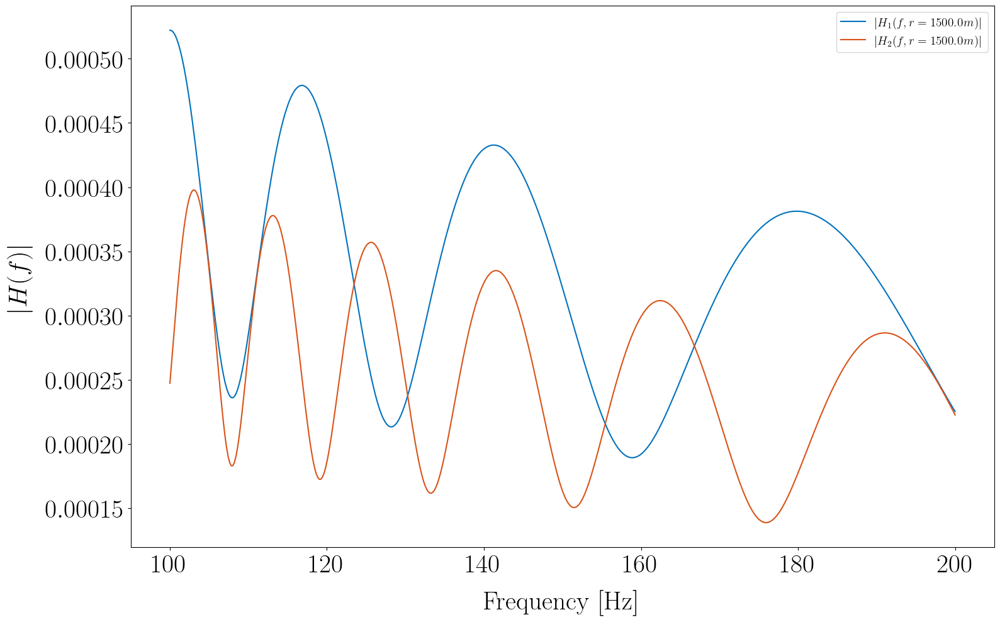

In [6]:
tf1_mod = np.abs(ds.H1)
tf2_mod = np.abs(ds.H2)
plt.figure()
tf1_mod.sel(r=ds.r_ref, method="nearest").plot(label=fr"$\lvert H_1 (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0))
tf2_mod.sel(r=ds.r_ref, method="nearest").plot(label=fr"$\lvert H_2 (f, r={{{ds.r_ref}}}m) \rvert$", color=color(1))
plt.ylabel(r"$\lvert H(f) \rvert$")
plt.legend()
plt.title("")


### Rapport des fonctions de transfert 

Text(0.5, 1.0, '')

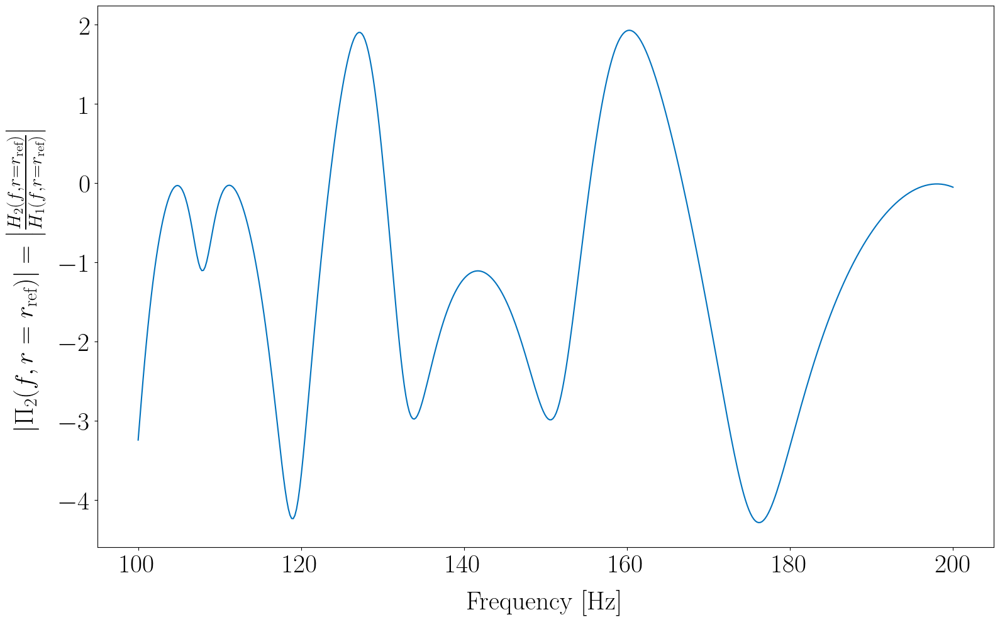

In [7]:
rtf2_mod = ds.module.sel(h_index=2)
rtf2_mod_log = 10 * np.log10(rtf2_mod)
plt.figure()
rtf2_mod_log.sel(r=ds.r_ref, method="nearest").plot(
    label=rf"$\lvert \Pi_{2} (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0)
)
# rtf2_mod_log.sel(r=ds.r_ref, method="nearest").plot(
#     label=rf"$\lvert \Pi_{2} (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0)
# )
plt.ylabel(
    r"$\lvert \Pi_2(f, r=r_\text{ref}) \rvert = \left \lvert \frac{H_2(f, r=r_\text{ref})}{H_1(f, r=r_\text{ref})}  \right \rvert$"
)
# plt.yscale("log")
plt.title("")
# plt.legend(fontsize=16)

### Pertes dans le guide d'onde 


In [8]:
I_1 = np.abs(4 * np.pi * ds.H1) ** 2
I_2 = np.abs(4 * np.pi * ds.H2) ** 2
I_1_dB = -10 * np.log10(I_1 + 1e-12)
I_2_dB = -10 * np.log10(I_2 + 1e-12)

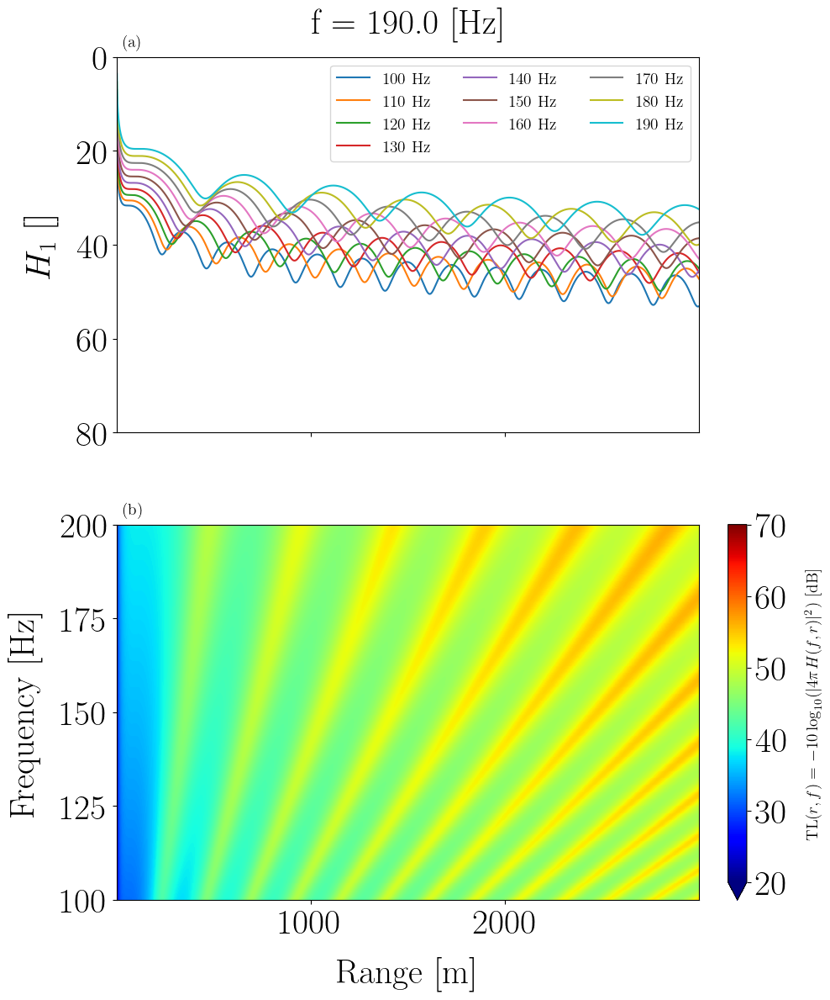

In [9]:
plot_intensity(I_1_dB, fmin, fmax, step_f=10)

Les pertes par transmission font apparaitre le pattern d'interférence caractéristique. La pente des maximas est décrite par l'invariant de guide d'onde.  

**Remarque**
Cet exemple est légèrement différent de celui présenté dans le Jensen p.134 (fig 2.31). En effet, d'après le Jensen, la figure 2.31 représente les structures d'interférences dans un guide d'onde idéal pour une source à $z_s = 36$ m, néanmoins la figure 2.31.a ne colle pas avec les pertes par transmissions observées dans ce guide d'onde dans la même configuration et représentées sur la figure 2.23. Il s'agit vraisemblablement d'une coquille et la figure 2.31 représente probablement les structures d'interférences observées dans le guide de Pekeris dont les pertes sont tracées sur la figure 2.30 (p.131). 

Ici, le guide d'onde est le guide d'onde idéal présenté sur la figure 2.16 (p.103). La gamme de fréquence inclue f = 20 Hz dans le but de pouvoir vérifier que la solution (les pertes) coïncide avec la solution présentée sur la figure 2.23 (p.115), ce que l'on peut vérifier. 

### Lien avec le rapport des fonctions de transfert 

Les pertes par transmissions associées à chacun des capteurs s'écrivent : 
$$
\text{TL}_1(r, f) = -10 \log_{10}(\lvert 4 \pi H_1(f, r) \rvert^2)
$$ 
et
$$
\text{TL}_2(r, f) = -10 \log_{10}(\lvert 4 \pi H_2(f, r) \rvert^2)
$$ 

Le module du rapport des fonctions de transfert s'écrit donc en fonction des pertes $\text{TL}_1(r, f)$ et $\text{TL}_2(r, f)$ :

$$
10 \log_{10} \left( \lvert \Pi_2(f, r) \rvert^2 \right) =  10 \log_{10}(\left \lvert \frac{4 \pi H_2(f, r)}{4 \pi H_1(f, r)} \right \rvert^2)
\newline =  \text{TL}_1(r, f) - \text{TL}_2(r, f) 
$$


(<Figure size 1600x1200 with 6 Axes>,
 array([<Axes: title={'center': '$\\text{TL}_1(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_1(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$\\text{TL}_2(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_2(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$10 \\log_{10} \\left( \\lvert \\Pi_2(f, r) \\rvert^2 \\right) =  \\text{TL}_1(r, f) - \\text{TL}_2(r, f) $'}>],
       dtype=object))

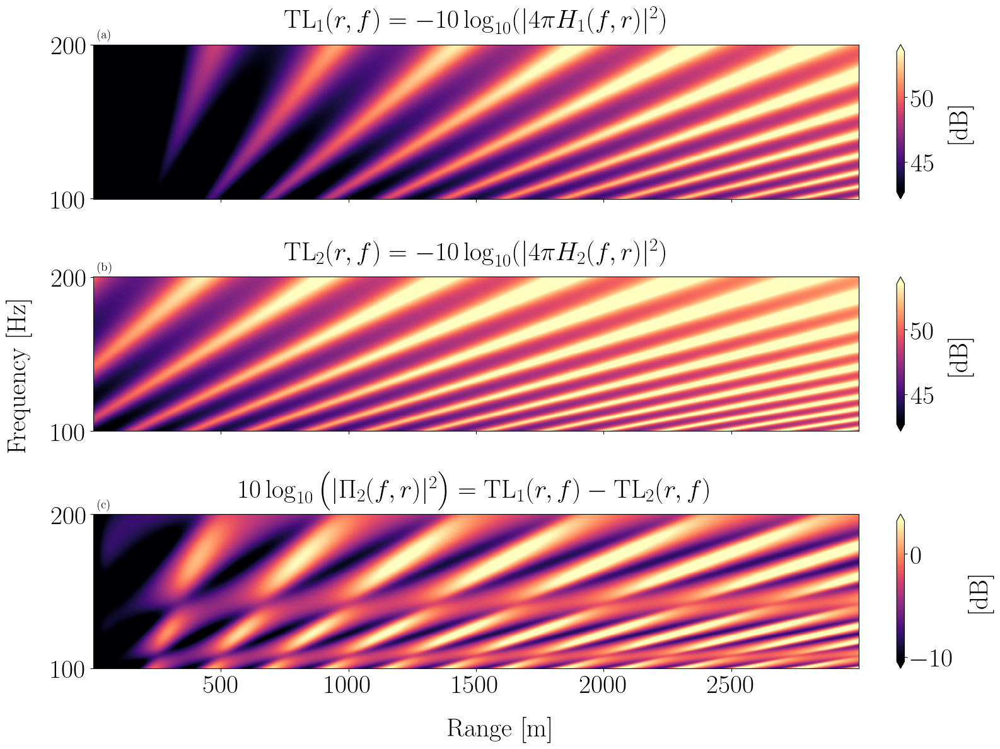

In [10]:
plot_tl_pi_frequency_range_plan(I_1_dB, I_2_dB, rtf2_mod, x_coord="r", y_coord="f")

On peut également visualiser dans le plan (f, r) comme précédemment (par exemple pour les essais Groix)

(<Figure size 1600x1200 with 6 Axes>,
 array([<Axes: title={'center': '$\\text{TL}_1(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_1(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$\\text{TL}_2(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_2(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$10 \\log_{10} \\left( \\lvert \\Pi_2(f, r) \\rvert^2 \\right) =  \\text{TL}_1(r, f) - \\text{TL}_2(r, f) $'}>],
       dtype=object))

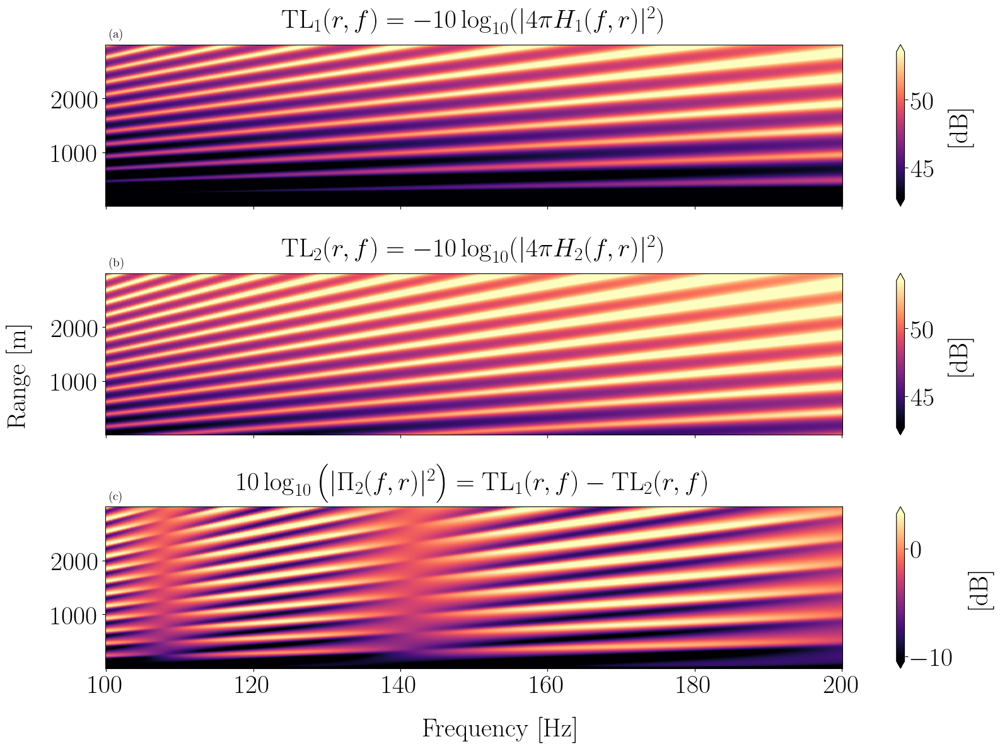

In [11]:
plot_tl_pi_frequency_range_plan(I_1_dB, I_2_dB, rtf2_mod, x_coord="f", y_coord="r")

## Cas M = 3

On considère à présent le cas M=3. 

In [12]:
distances=["hermitian_angle"]

ds = run_full_study(
    bottom_bc=bottom_bc,
    waveguide_depth=waveguide_depth,
    d_inter_rcv=d_inter_rcv,
    z_rcv=z_rcv,
    src_ref_range=src_ref_range,
    z_src=z_src,
    nrgrid=nrgrid,
    delta_r=delta_r,
    fmin=fmin,
    fmax=fmax,
    nfgrid=nfgrid,
    root_img=sensibility_img_folder,
    distances=distances,
    n_modes=3,
)

Number of propagating modes at fmin = 100 Hz : 4
Number of propagating modes at fmax = 200 Hz : 8
Computing RTF using  M = 3 modes (instead of all the propagating modes which are 8 at fmax)
Dataset computed


### Allure des fonctions de transfert 

Text(0.5, 1.0, '')

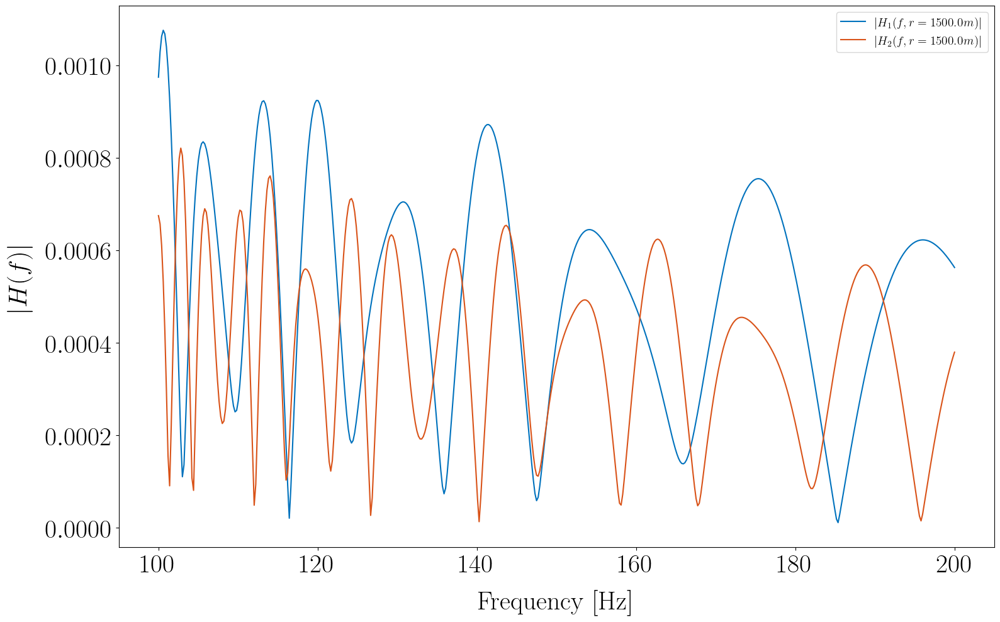

In [13]:
tf1_mod = np.abs(ds.H1)
tf2_mod = np.abs(ds.H2)
plt.figure()
tf1_mod.sel(r=ds.r_ref, method="nearest").plot(label=fr"$\lvert H_1 (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0))
tf2_mod.sel(r=ds.r_ref, method="nearest").plot(label=fr"$\lvert H_2 (f, r={{{ds.r_ref}}}m) \rvert$", color=color(1))
plt.ylabel(r"$\lvert H(f) \rvert$")
plt.legend()
plt.title("")


### Rapport des fonctions de transfert 

Text(0.5, 1.0, '')

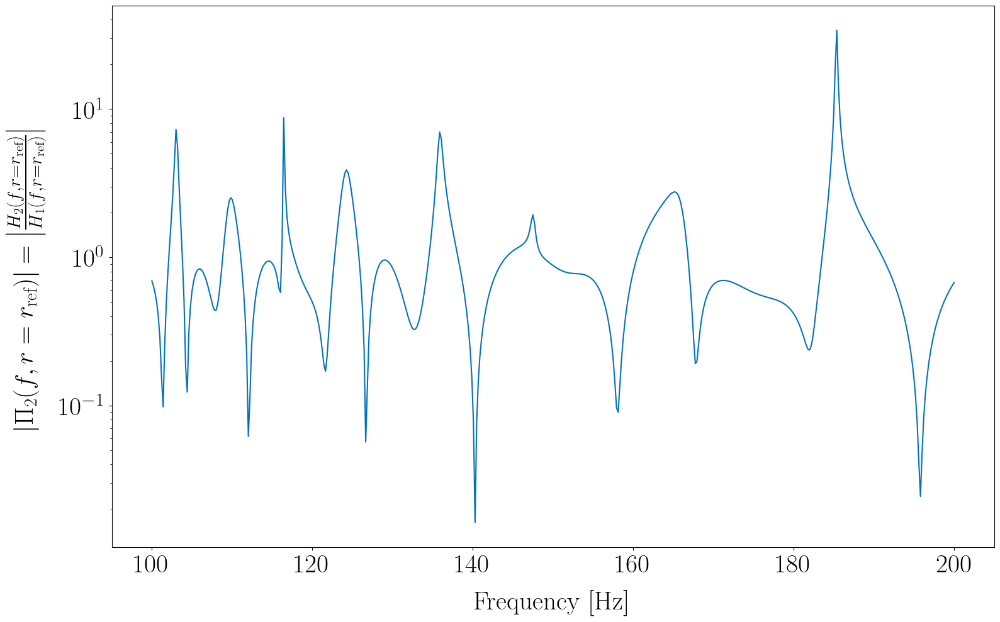

In [14]:
rtf2_mod = ds.module.sel(h_index=2)
# rtf2_mod_log = 10 * np.log10(rtf2_mod)
plt.figure()
rtf2_mod.sel(r=ds.r_ref, method="nearest").plot(
    label=rf"$\lvert \Pi_{2} (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0)
)
# rtf2_mod_log.sel(r=ds.r_ref, method="nearest").plot(
#     label=rf"$\lvert \Pi_{2} (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0)
# )
plt.ylabel(
    r"$\lvert \Pi_2(f, r=r_\text{ref}) \rvert = \left \lvert \frac{H_2(f, r=r_\text{ref})}{H_1(f, r=r_\text{ref})}  \right \rvert$"
)
plt.yscale("log")
plt.title("")
# plt.legend(fontsize=16)

In [ ]:
rtf2_mod = ds.module.sel(h_index=2)
rtf2_mod_log = 10 * np.log10(rtf2_mod)
plt.figure()
# rtf2_mod.sel(r=ds.r_ref, method="nearest").plot(
#     label=rf"$\lvert \Pi_{2} (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0)
# )
rtf2_mod_log.sel(r=ds.r_ref, method="nearest").plot(
    label=rf"$\lvert \Pi_{2} (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0)
)
plt.ylabel(
    r"$\lvert \Pi_2(f, r=r_\text{ref}) \rvert = \left \lvert \frac{H_2(f, r=r_\text{ref})}{H_1(f, r=r_\text{ref})}  \right \rvert$"
)
# plt.yscale("log")
plt.title("")
# plt.legend(fontsize=16)

### Pertes dans le guide d'onde 


In [15]:
I_1 = np.abs(4 * np.pi * ds.H1) ** 2
I_2 = np.abs(4 * np.pi * ds.H2) ** 2
I_1_dB = -10 * np.log10(I_1 + 1e-12)
I_2_dB = -10 * np.log10(I_2 + 1e-12)

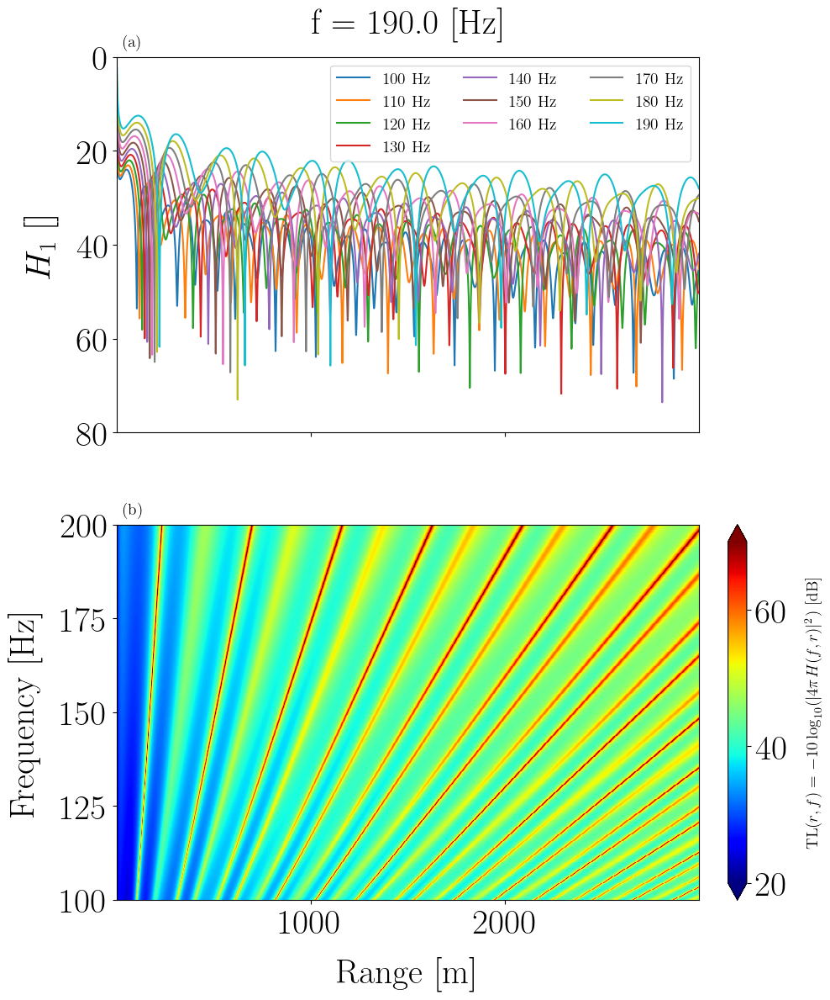

In [16]:
plot_intensity(I_1_dB, fmin, fmax, step_f=10)

L'ajout du mode m = 3, conduit à une structure légèrement plus complexe. Les structures plus fine échelle observables résultent des interférences mode 3 / mode 1 ($\Delta_{k_{31}}$)et mode 3 / mode 2 ($\Delta_{k_{32}}$). 

(<Figure size 1600x1200 with 6 Axes>,
 array([<Axes: title={'center': '$\\text{TL}_1(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_1(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$\\text{TL}_2(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_2(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$10 \\log_{10} \\left( \\lvert \\Pi_2(f, r) \\rvert^2 \\right) =  \\text{TL}_1(r, f) - \\text{TL}_2(r, f) $'}>],
       dtype=object))

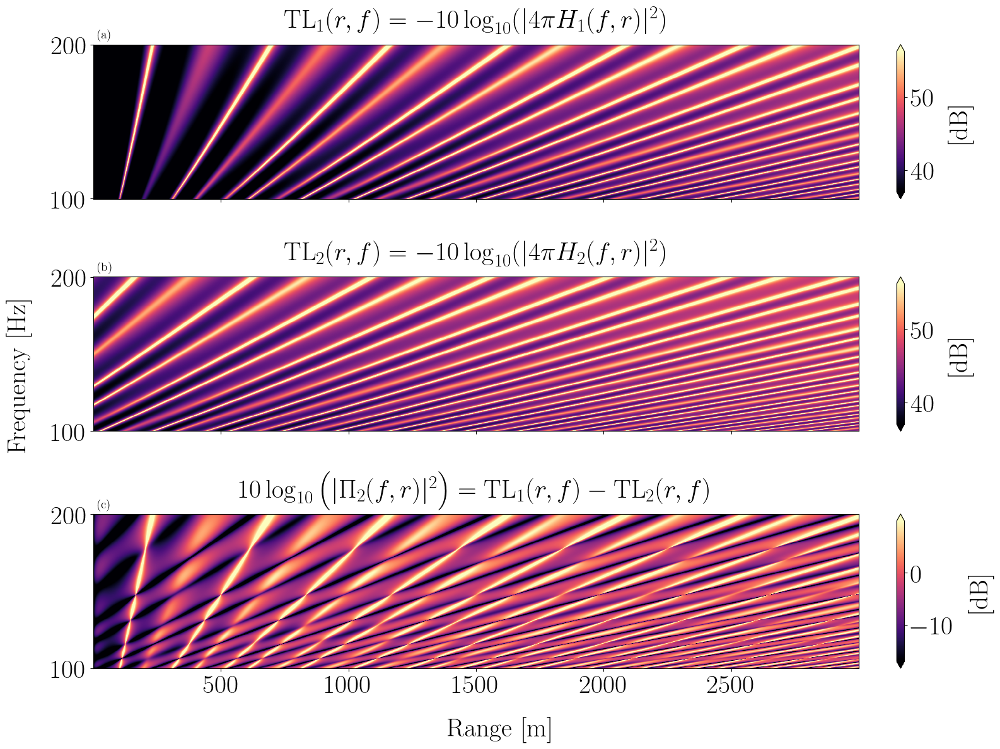

In [17]:
plot_tl_pi_frequency_range_plan(I_1_dB, I_2_dB, rtf2_mod, x_coord="r", y_coord="f")

On peut également visualiser dans le plan (f, r) comme précédemment (par exemple pour les essais Groix)

(<Figure size 1600x1200 with 6 Axes>,
 array([<Axes: title={'center': '$\\text{TL}_1(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_1(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$\\text{TL}_2(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_2(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$10 \\log_{10} \\left( \\lvert \\Pi_2(f, r) \\rvert^2 \\right) =  \\text{TL}_1(r, f) - \\text{TL}_2(r, f) $'}>],
       dtype=object))

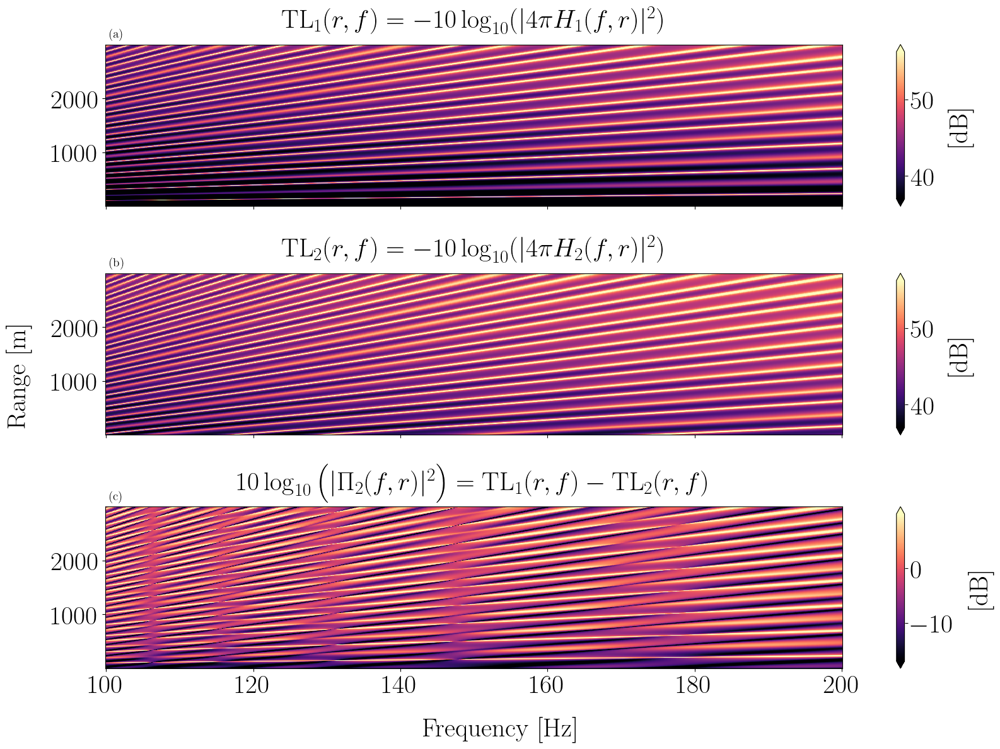

In [18]:
plot_tl_pi_frequency_range_plan(I_1_dB, I_2_dB, rtf2_mod, x_coord="f", y_coord="r")

## Mode M > 3

Number of propagating modes at fmin = 100 Hz : 4
Number of propagating modes at fmax = 200 Hz : 8
Computing RTF using  M = 3 modes (instead of all the propagating modes which are 8 at fmax)
Dataset computed


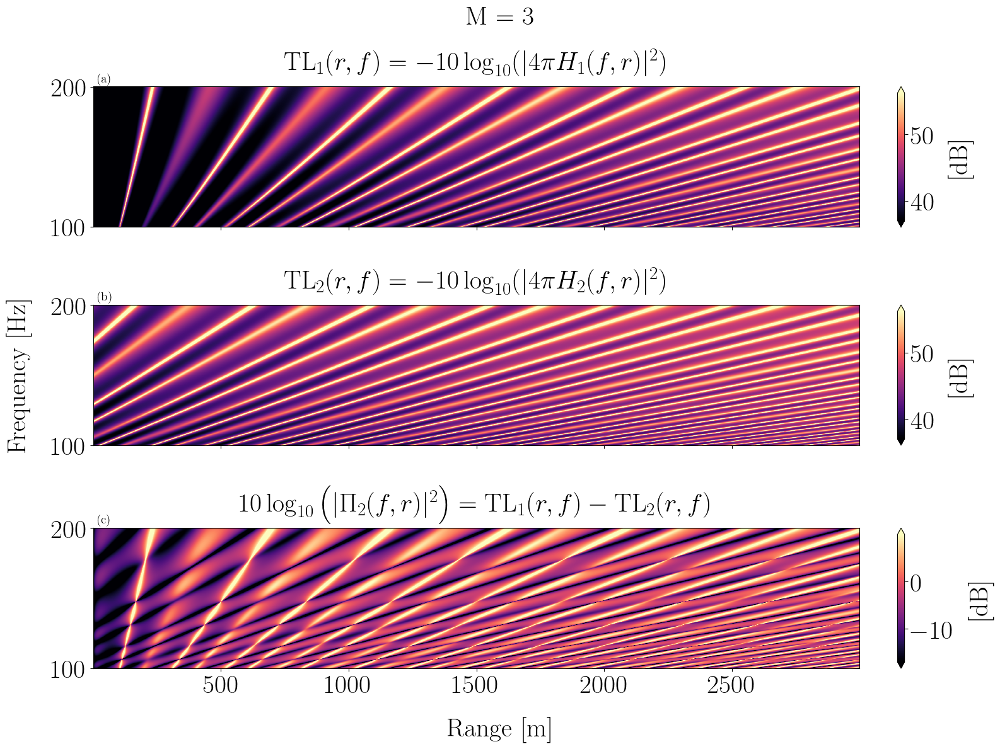

Number of propagating modes at fmin = 100 Hz : 4
Number of propagating modes at fmax = 200 Hz : 8
Computing RTF using  M = 4 modes (instead of all the propagating modes which are 8 at fmax)
Dataset computed


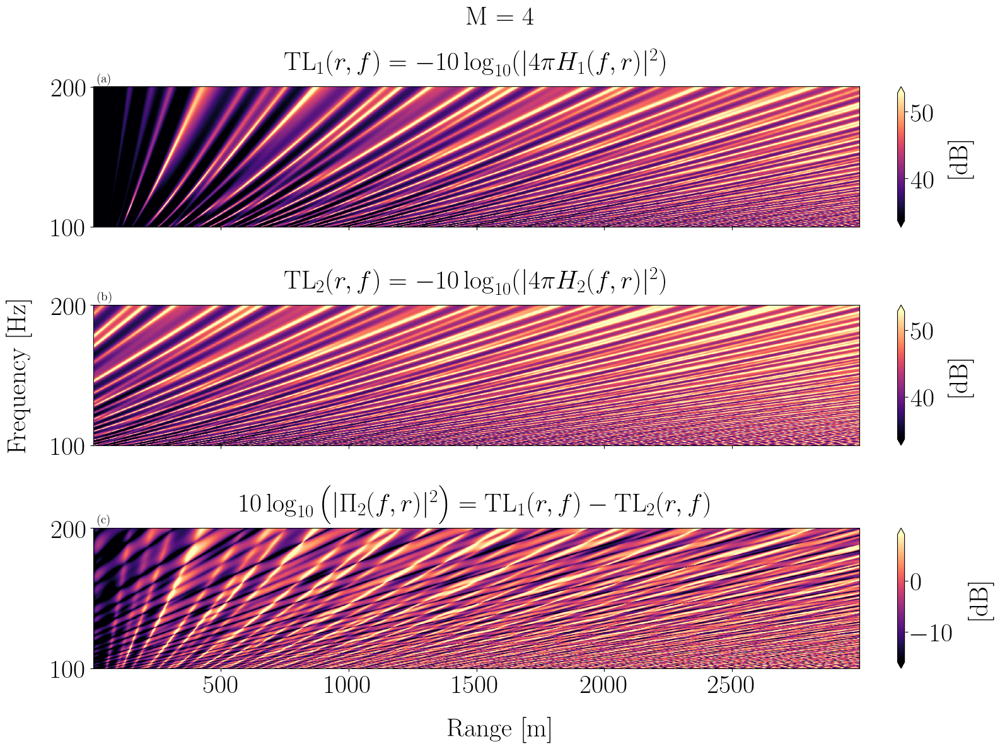

Number of propagating modes at fmin = 100 Hz : 4
Number of propagating modes at fmax = 200 Hz : 8
Computing RTF using  M = 5 modes (instead of all the propagating modes which are 8 at fmax)
Dataset computed


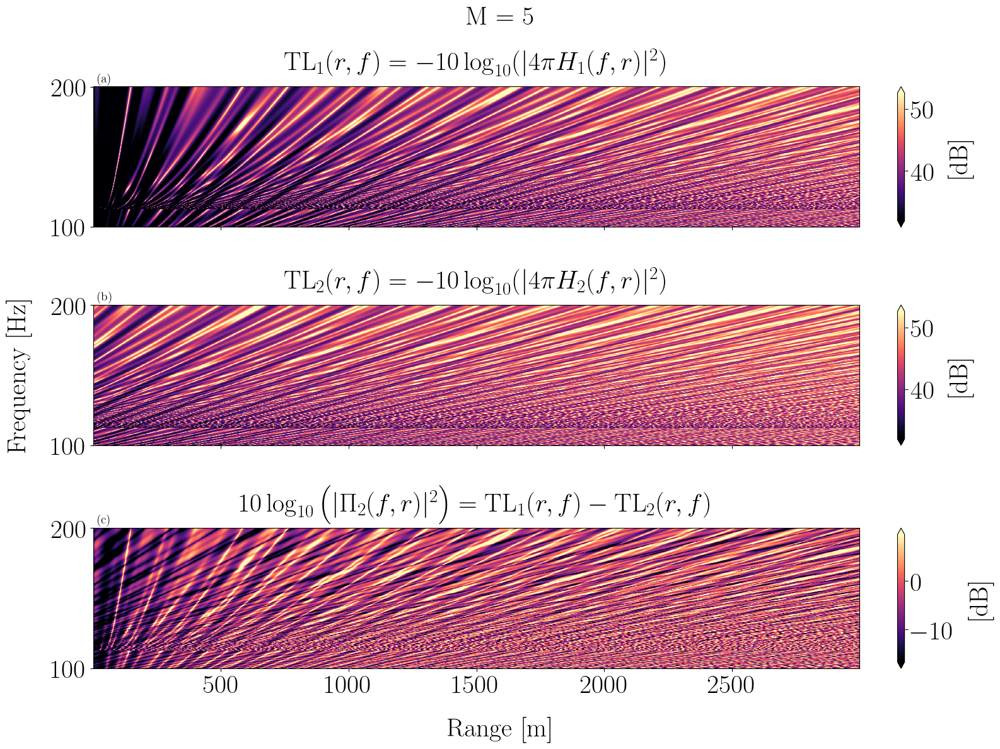

In [19]:
distances=["hermitian_angle"]

for m in range(3, 6):
    ds = run_full_study(
        bottom_bc=bottom_bc,
        waveguide_depth=waveguide_depth,
        d_inter_rcv=d_inter_rcv,
        z_rcv=z_rcv,
        src_ref_range=src_ref_range,
        z_src=z_src,
        nrgrid=nrgrid,
        delta_r=delta_r,
        fmin=fmin,
        fmax=fmax,
        nfgrid=nfgrid,
        root_img=sensibility_img_folder,
        distances=distances,
        n_modes=m,
    )

    I_1 = np.abs(4 * np.pi * ds.H1) ** 2
    I_2 = np.abs(4 * np.pi * ds.H2) ** 2
    I_1_dB = -10 * np.log10(I_1 + 1e-12)
    I_2_dB = -10 * np.log10(I_2 + 1e-12)

    rtf2_mod = ds.module.sel(h_index=2)

    fig, axs = plot_tl_pi_frequency_range_plan(
        I_1_dB, I_2_dB, rtf2_mod, x_coord="r", y_coord="f"
    )
    fig.suptitle(f"M = {m}")
    plt.show()

## Distribution des modules de RTF 

Afin d'évaluer le potentiel des distributions du module des RTFs comme candidat pour caractériser chaque RTF on étudie les variations de ces distributions dans ce guide d'onde simple. 

Dans la suite la distribution étudiée est la distribution des $\lvert \Pi_2(f) \rvert_{f \in [f_{min}, f_{max}]}$. L'idée est de construire l'histogramme de chacun des module de RTF (i.e pour chaque r donné). 


### Cas M = 2

In [20]:
ds = run_full_study(
    bottom_bc=bottom_bc,
    waveguide_depth=waveguide_depth,
    d_inter_rcv=d_inter_rcv,
    z_rcv=z_rcv,
    src_ref_range=src_ref_range,
    z_src=z_src,
    nrgrid=nrgrid,
    delta_r=delta_r,
    fmin=fmin,
    fmax=fmax,
    nfgrid=nfgrid,
    root_img=sensibility_img_folder,
    distances=distances,
    n_modes=2,
)

I_1 = np.abs(4 * np.pi * ds.H1) ** 2
I_2 = np.abs(4 * np.pi * ds.H2) ** 2
I_1_dB = -10 * np.log10(I_1 + 1e-12)
I_2_dB = -10 * np.log10(I_2 + 1e-12)

rtf2_mod = ds.module.sel(h_index=2)

Number of propagating modes at fmin = 100 Hz : 4
Number of propagating modes at fmax = 200 Hz : 8
Computing RTF using  M = 2 modes (instead of all the propagating modes which are 8 at fmax)
Dataset computed


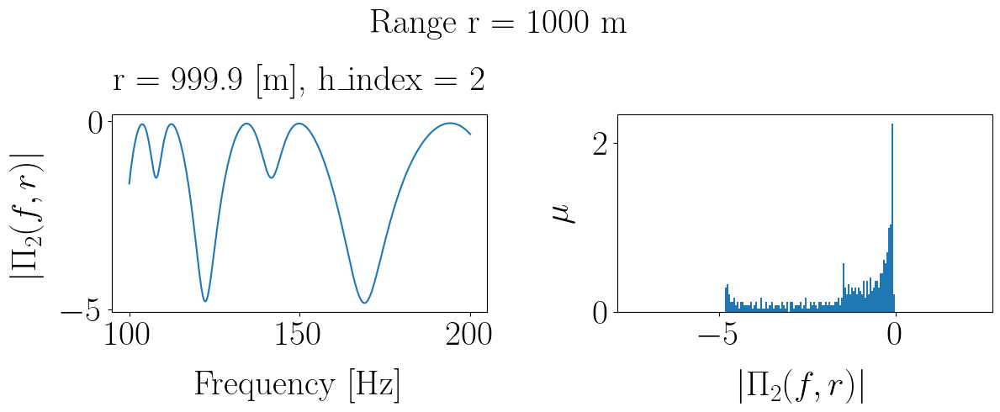

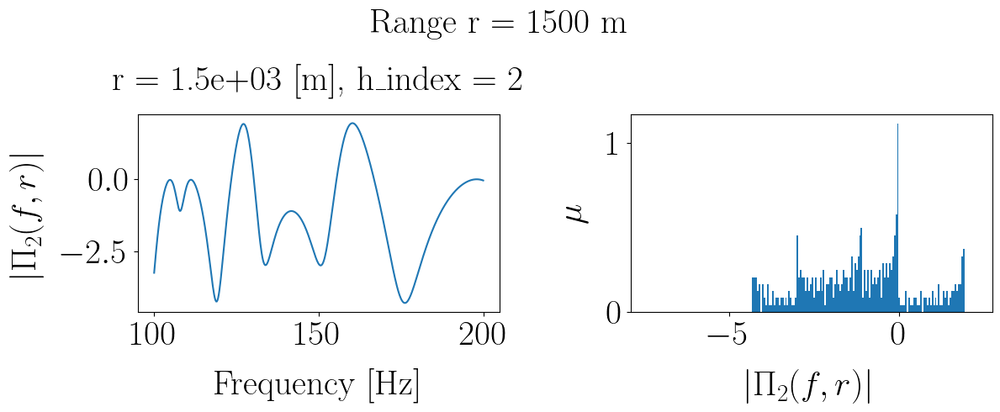

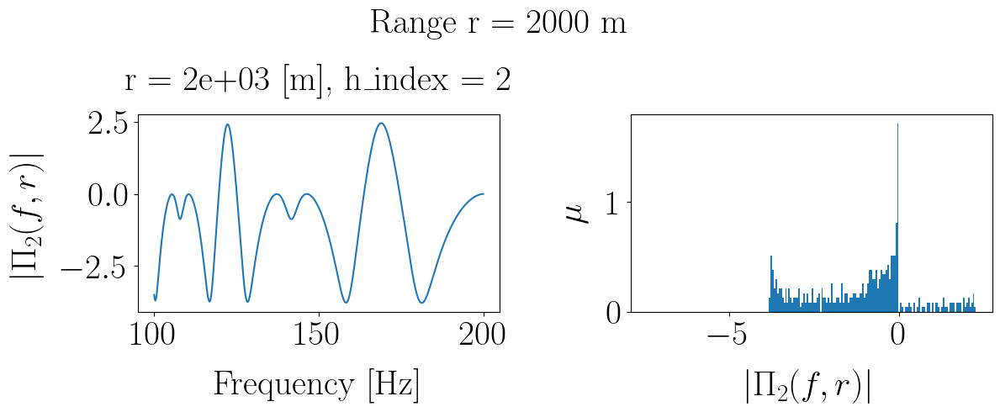

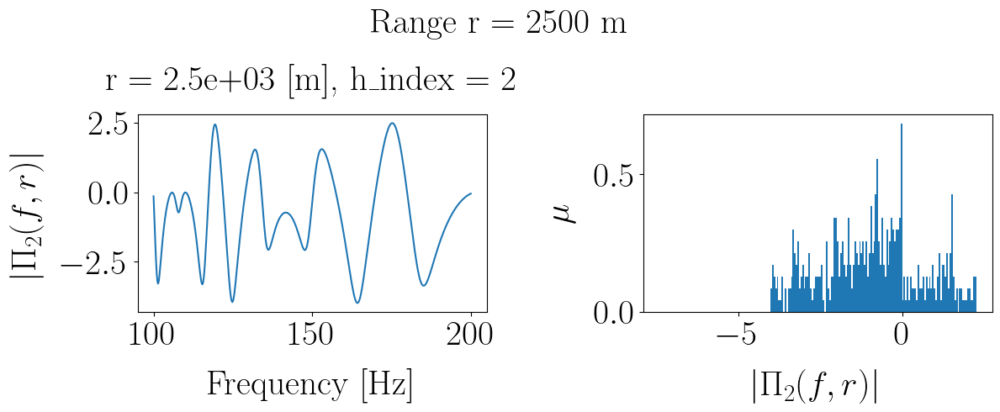

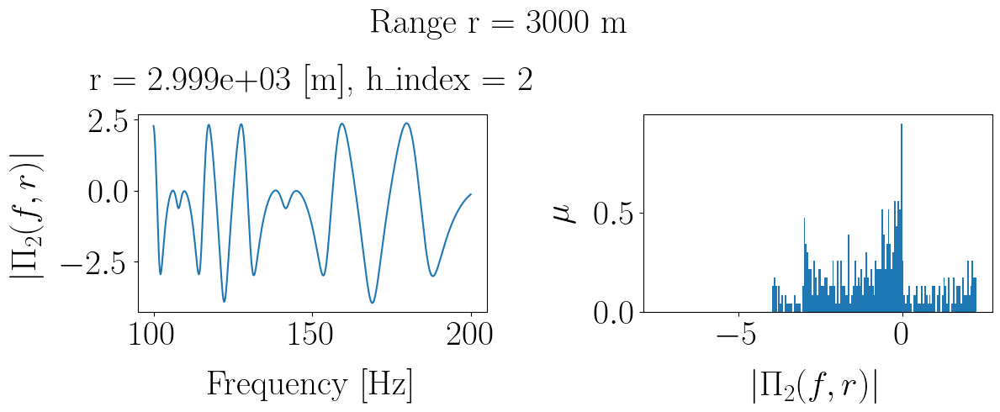

In [21]:
# Define a common range of values for the histograms
n_bins = 200
# # rtf2_mod_min = rtf2_mod.min().item()
# # rtf2_mod_max = rtf2_mod.max().item()
# rtf2_mod_min = np.percentile(rtf2_mod.values, 1)
# rtf2_mod_max = np.percentile(rtf2_mod.values, 99)

rtf2_mod_min = np.percentile(10*np.log10(rtf2_mod).values, 1)
rtf2_mod_max = np.percentile(10*np.log10(rtf2_mod).values, 99)

r_ = ds.r.values
r_ = [1000, 1500, 2000, 2500, 3000]
for r in r_:
    rtf2_mod_r = rtf2_mod.sel(r=r, method="nearest")
    rtf2_mod_r_log = 10 * np.log10(rtf2_mod_r)
    # rtf2_mod_r_hist, bin_edges = np.histogram(
    #     rtf2_mod_r_log.values,
    #     bins=n_bins,
    #     range=(rtf2_mod_min, rtf2_mod_max),
    #     density=True,
    # )
    # rtf2_mod_r_hist, bin_edges = np.histogram(rtf2_mod_r.values, bins=n_bins, range=(rtf2_mod_min, rtf2_mod_max), density=True)
    rtf2_mod_r_hist, bin_edges = np.histogram(
        rtf2_mod_r_log.values,
        bins=n_bins,
        range=(rtf2_mod_min, rtf2_mod_max),
        density=True,
    )

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    # Plot RTF modulus as a function of frequency
    rtf2_mod_r_log.plot(ax=axs[0])
    # rtf2_mod_r.plot(ax=axs[0])

    # axs[0].set_yscale("log")
    # axs[0].set_title(f"RTF Modulus at r={r} m")
    axs[0].set_xlabel("Frequency [Hz]")
    axs[0].set_ylabel(r"$\lvert \Pi_2(f, r) \rvert$")
    # Plot histogram of RTF modulus values
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    axs[1].bar(bin_centers, rtf2_mod_r_hist, width=bin_edges[1] - bin_edges[0])
    # axs[1].set_title(f"Histogram of RTF Modulus at r={r} m")
    axs[1].set_xlabel(r"$\lvert \Pi_2(f, r) \rvert$")
    axs[1].set_ylabel(r"$\mu$") 

    fig.suptitle(f"Range r = {r} m")

c:\Users\baptiste.menetrier\.virtualenvs\phd-FBjz4hBd\Lib\site-packages\numpy\lib\_histograms_impl.py:897: RuntimeWarning: invalid value encountered in divide
  return n / db / n.sum(), bin_edges


Text(0.5, 0, '$\\lvert \\Pi_2(f, r) \\rvert$')

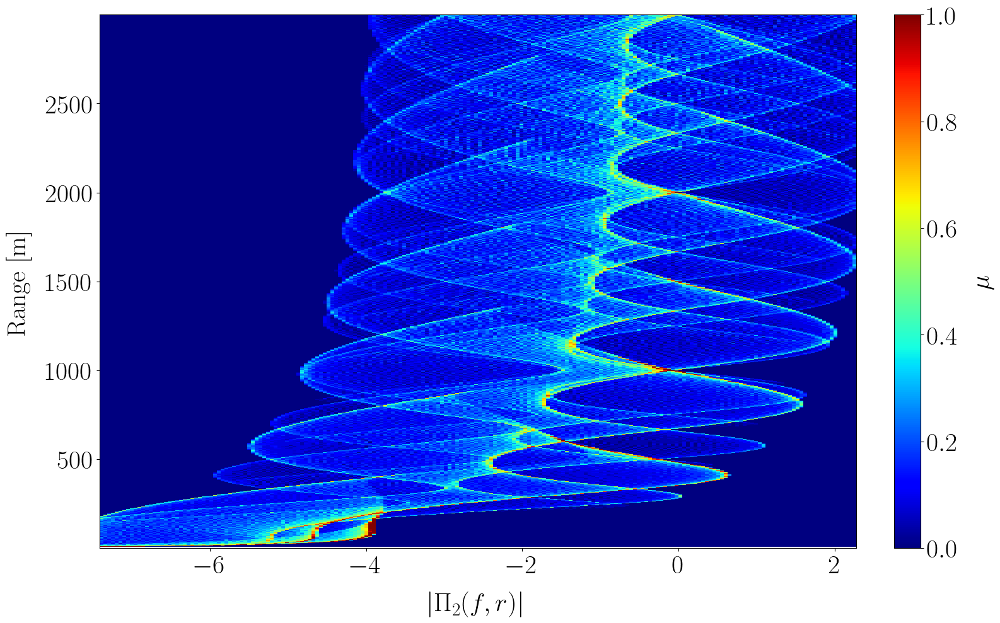

In [22]:
# Define a common range of values for the histograms
n_bins = 200
# rtf2_mod_min = rtf2_mod.min().item()
# rtf2_mod_max = rtf2_mod.max().item()
# rtf2_mod_min = np.percentile(rtf2_mod.values, 1)
# rtf2_mod_max = np.percentile(rtf2_mod.values, 99)

rtf2_mod_min = np.percentile(10 * np.log10(rtf2_mod).values, 1)
rtf2_mod_max = np.percentile(10 * np.log10(rtf2_mod).values, 99)

r_ = ds.r.values
rtf2_mod_hist_arr = np.zeros((len(r_), n_bins))
for ir, r in enumerate(r_):
    rtf2_mod_r = rtf2_mod.sel(r=r, method="nearest")
    rtf2_mod_r_log = 10 * np.log10(rtf2_mod_r)

    # rtf2_mod_r_hist, bin_edges = np.histogram(
    #     rtf2_mod_r_log.values,
    #     bins=n_bins,
    #     range=(rtf2_mod_min, rtf2_mod_max),
    #     density=True,
    # )

    # rtf2_mod_r_hist, bin_edges = np.histogram(
    #     rtf2_mod_r.values, bins=n_bins, range=(rtf2_mod_min, rtf2_mod_max), density=True
    # )
    rtf2_mod_r_hist, bin_edges = np.histogram(
        rtf2_mod_r_log.values,
        bins=n_bins,
        range=(rtf2_mod_min, rtf2_mod_max),
        density=True,
    )

    rtf2_mod_hist_arr[ir, :] = rtf2_mod_r_hist


bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure()
im = plt.pcolormesh(bin_centers, r_, rtf2_mod_hist_arr, shading="auto", cmap="jet", vmin=0, vmax=1)
plt.colorbar(im, label=r"$\mu$")
plt.ylabel("Range [m]")
plt.xlabel(r"$\lvert \Pi_2(f, r) \rvert$")

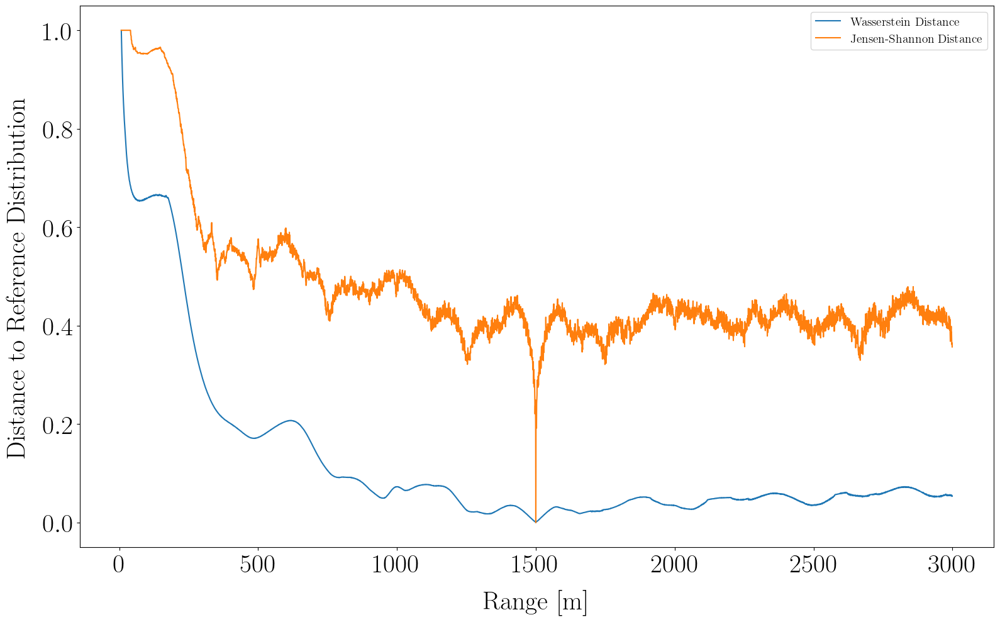

In [23]:
from scipy.stats import wasserstein_distance
from scipy.spatial.distance import jensenshannon

# mu_1 = rtf2_mod_hist_arr[10, :]
# mu_2 = rtf2_mod_hist_arr[11, :]
# wd = wasserstein_distance(u_values=mu_1, v_values=mu_2)
# print(wd)

idx_r_ref = np.argmin(np.abs(ds.r.values - ds.r_ref))
mu_ref = rtf2_mod_hist_arr[idx_r_ref, :]
wasserstein_dist_arr = np.zeros(len(r_))
jensenshannon_dist_arr = np.zeros(len(r_))
r_ = ds.r.values
for ir, r in enumerate(r_):
    mu_r = rtf2_mod_hist_arr[ir, :]

    if np.any(np.isnan(mu_r)):
        wd = np.nan
    else:

        distribution_support = np.arange(mu_ref.size)

        # TODO : update this to correclty compute ws distance
        wd = wasserstein_distance(
            u_values=distribution_support,
            v_values=distribution_support,
            u_weights=mu_ref,
            v_weights=mu_r,
        )
    # wd = wasserstein_distance(u_values=mu_ref, v_values=mu_r)
    js = jensenshannon(mu_ref, mu_r)
    wasserstein_dist_arr[ir] = wd
    jensenshannon_dist_arr[ir] = js

# Normalize both
wasserstein_dist_arr /= np.nanmax(wasserstein_dist_arr) 
jensenshannon_dist_arr /= np.nanmax(jensenshannon_dist_arr)
# wasserstein_dist_arr = (wasserstein_dist_arr - wasserstein_dist_arr.min()) / (
#     wasserstein_dist_arr.max() - wasserstein_dist_arr.min()
# )
# jensenshannon_dist_arr = (jensenshannon_dist_arr - jensenshannon_dist_arr.min()) / (
#     jensenshannon_dist_arr.max() - jensenshannon_dist_arr.min()
# )
plt.figure()
plt.plot(r_, wasserstein_dist_arr, label="Wasserstein Distance")
plt.plot(r_, jensenshannon_dist_arr, label="Jensen-Shannon Distance")
plt.xlabel("Range [m]")
plt.ylabel("Distance to Reference Distribution")
plt.legend()

Avec M = 2 modes, les distributions varient fortement avec la position de la source. La distance de Wasserstein permet d'obtenir les meilleurs résultats avec un lobe principal relativement large.  

### Cas M >= 3

Number of propagating modes at fmin = 100 Hz : 4
Number of propagating modes at fmax = 200 Hz : 8
Computing RTF using  M = 3 modes (instead of all the propagating modes which are 8 at fmax)
Dataset computed


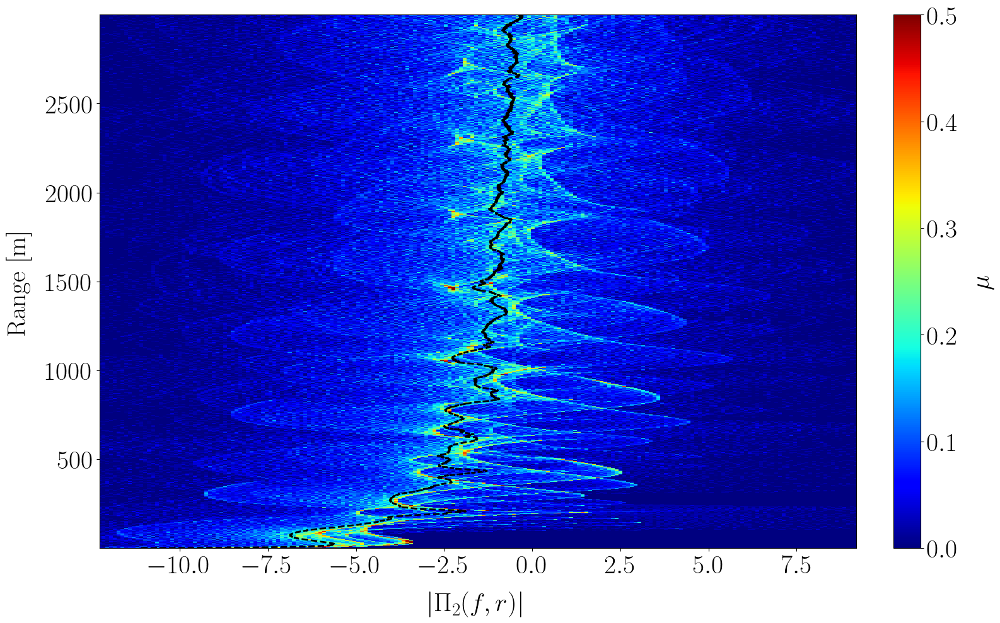

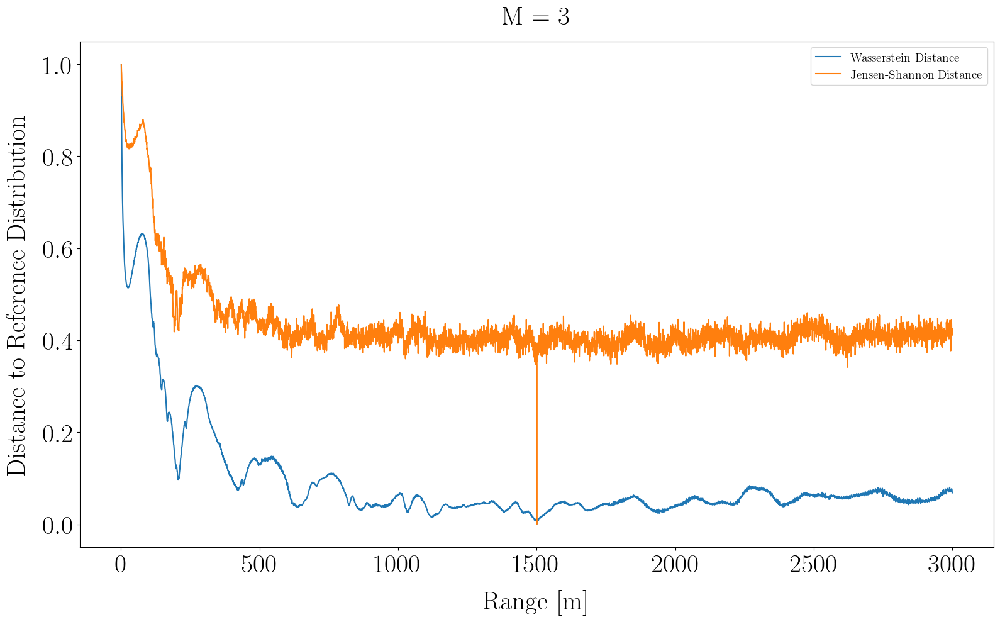

Number of propagating modes at fmin = 100 Hz : 4
Number of propagating modes at fmax = 200 Hz : 8
Computing RTF using  M = 4 modes (instead of all the propagating modes which are 8 at fmax)
Dataset computed


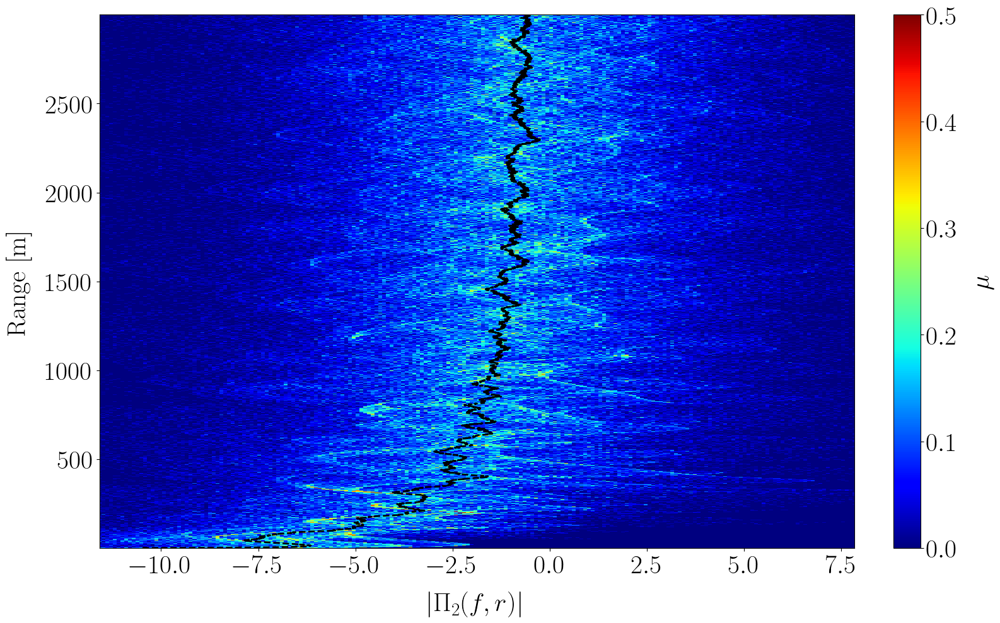

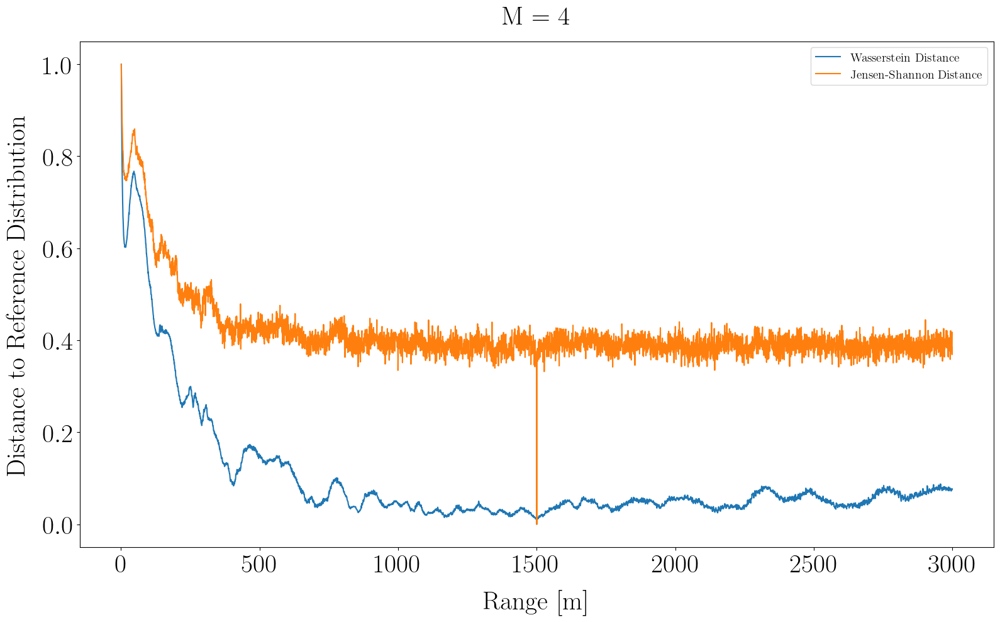

Number of propagating modes at fmin = 100 Hz : 4
Number of propagating modes at fmax = 200 Hz : 8
Computing RTF using  M = 5 modes (instead of all the propagating modes which are 8 at fmax)
Dataset computed


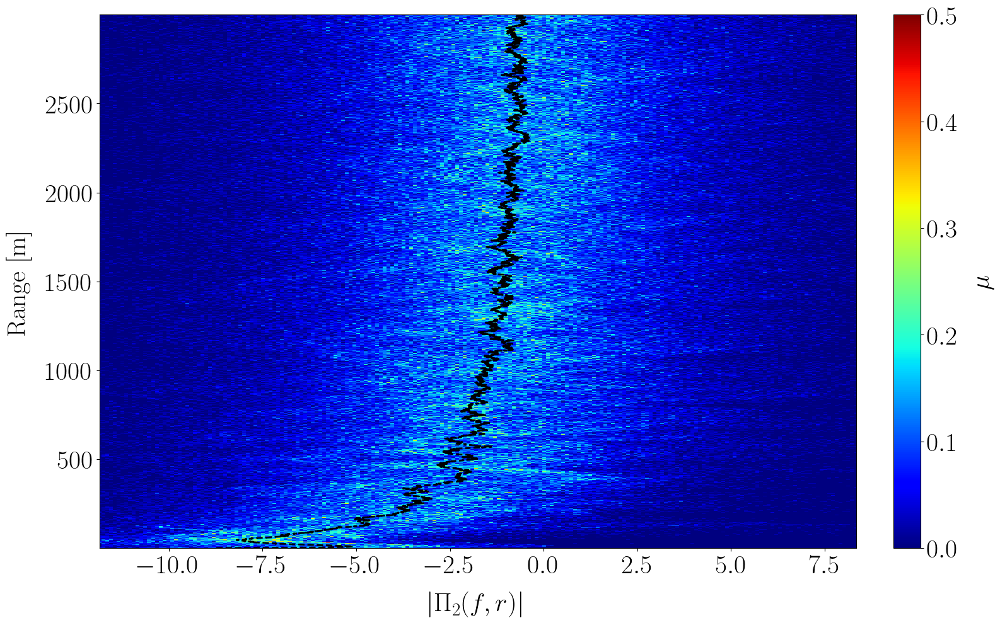

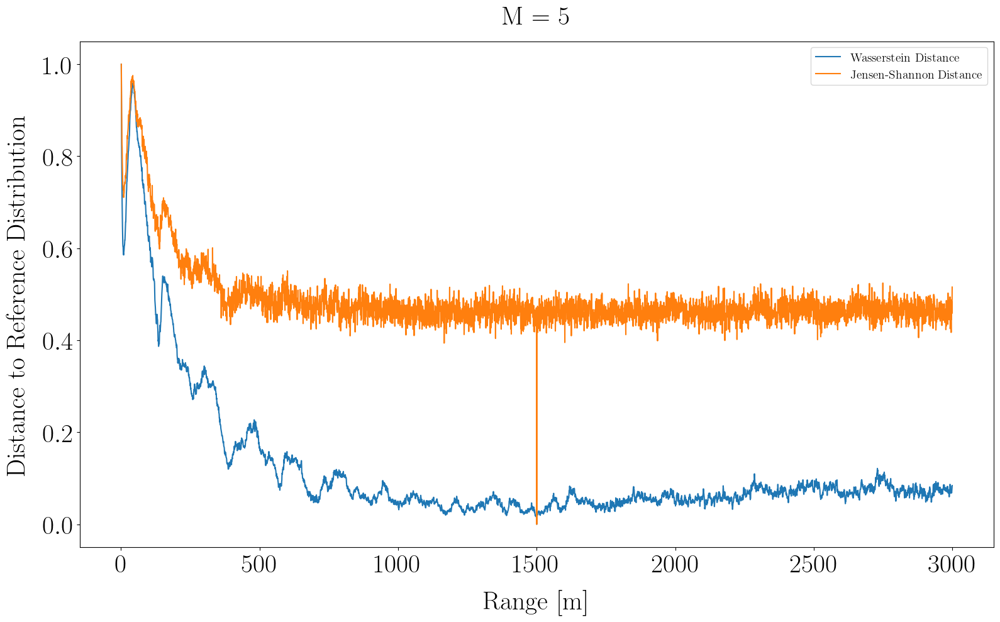

Number of propagating modes at fmin = 100 Hz : 4
Number of propagating modes at fmax = 200 Hz : 8
Computing RTF using  M = 6 modes (instead of all the propagating modes which are 8 at fmax)
Dataset computed


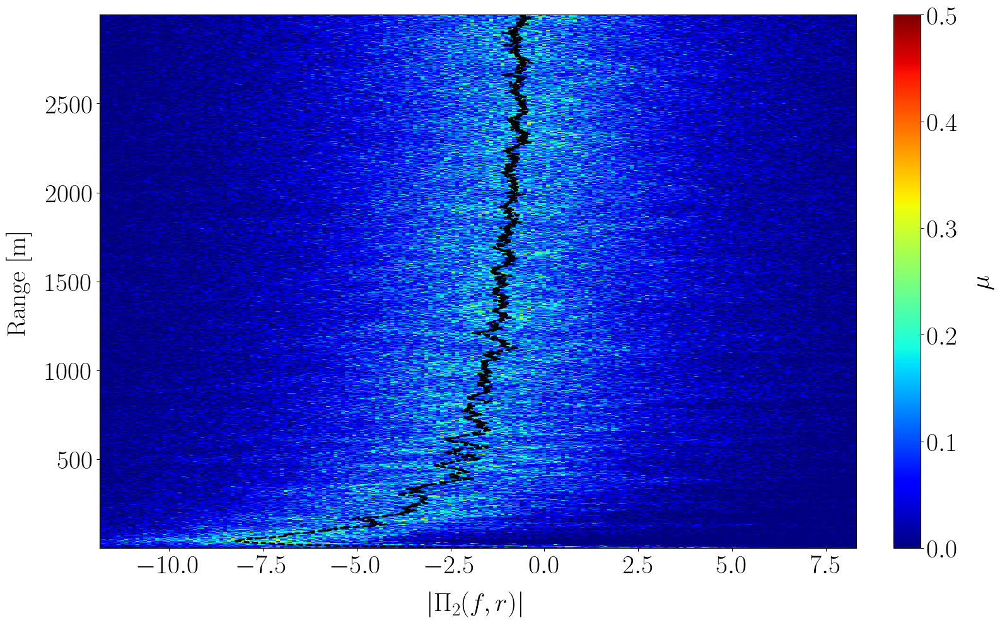

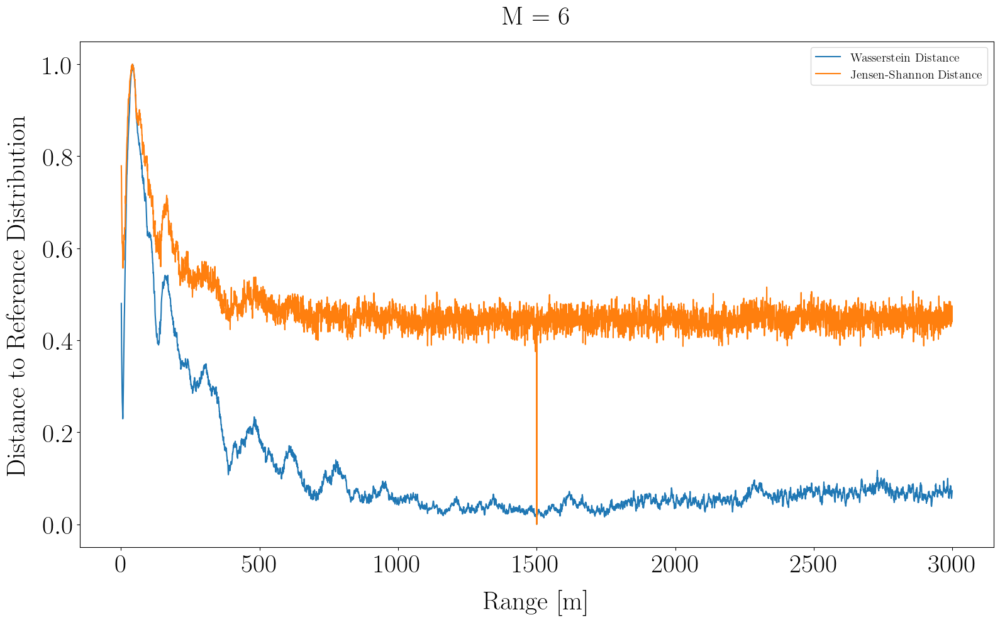

Number of propagating modes at fmin = 100 Hz : 4
Number of propagating modes at fmax = 200 Hz : 8
Computing RTF using  M = 7 modes (instead of all the propagating modes which are 8 at fmax)
Dataset computed


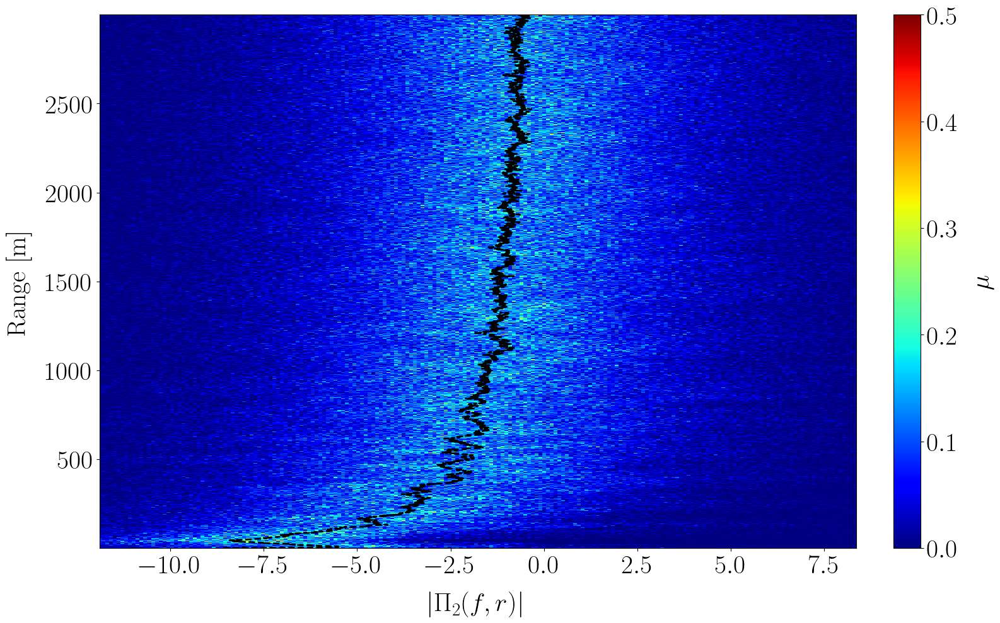

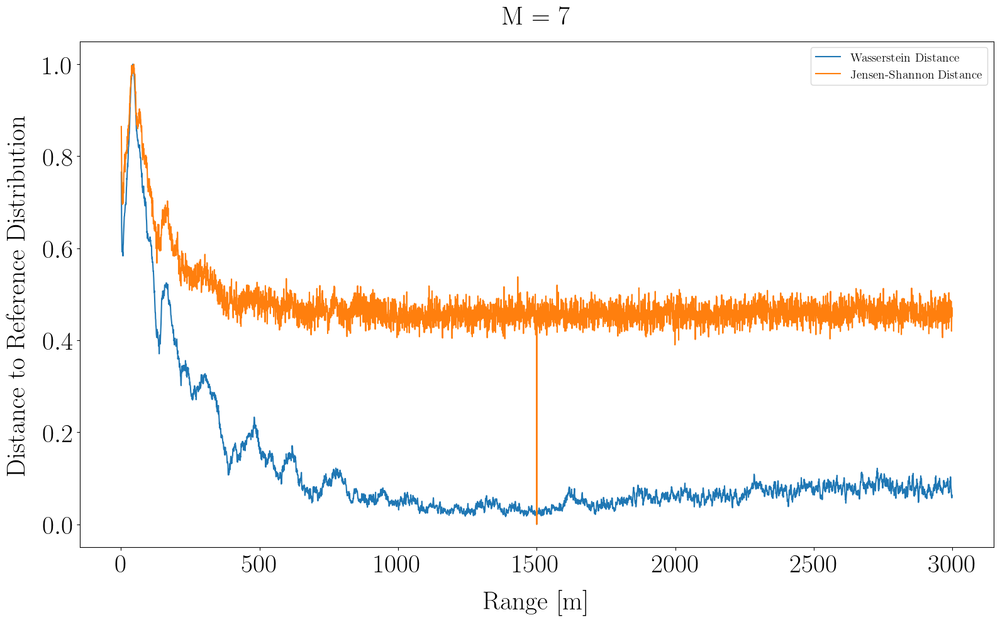

Number of propagating modes at fmin = 100 Hz : 4
Number of propagating modes at fmax = 200 Hz : 8
Computing RTF using  M = 8 modes (instead of all the propagating modes which are 8 at fmax)
Dataset computed


KeyboardInterrupt: 

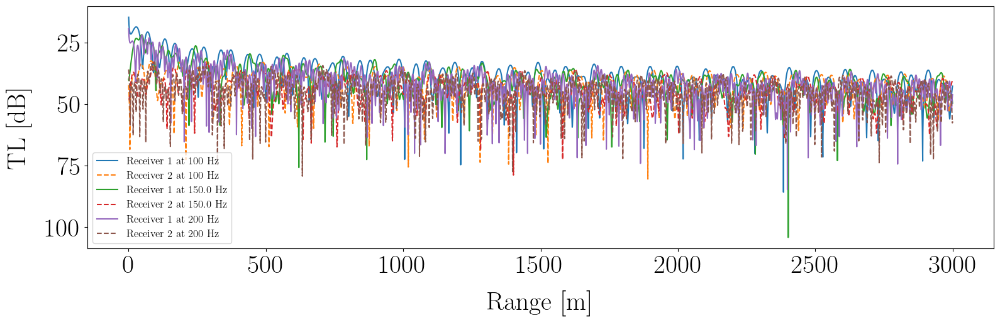

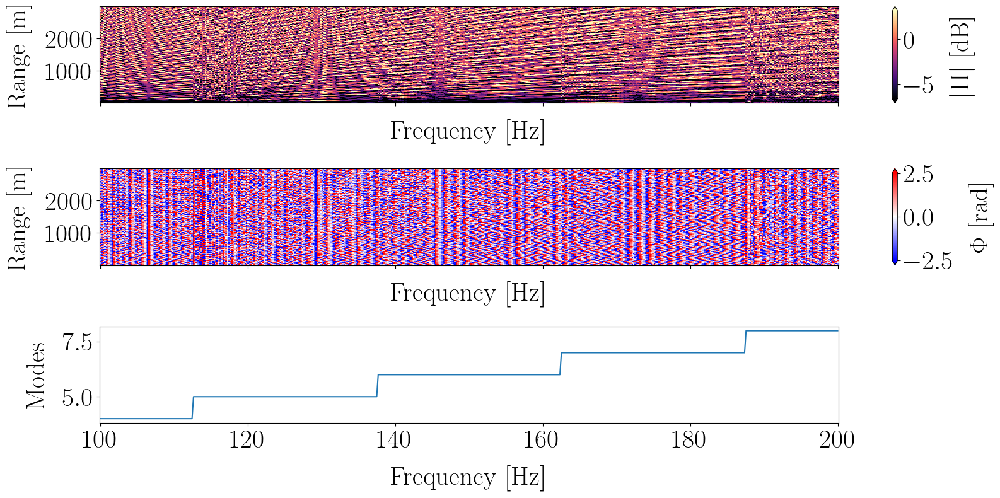

In [24]:
M_max = 13
for m in range(3, M_max+1):
    ds = run_full_study(
        bottom_bc=bottom_bc,
        waveguide_depth=waveguide_depth,
        d_inter_rcv=d_inter_rcv,
        z_rcv=z_rcv,
        src_ref_range=src_ref_range,
        z_src=z_src,
        nrgrid=nrgrid,
        delta_r=delta_r,
        fmin=fmin,
        fmax=fmax,
        nfgrid=nfgrid,
        root_img=sensibility_img_folder,
        distances=distances,
        n_modes=m,
    )

    I_1 = np.abs(4 * np.pi * ds.H1) ** 2
    I_2 = np.abs(4 * np.pi * ds.H2) ** 2
    I_1_dB = -10 * np.log10(I_1 + 1e-12)
    I_2_dB = -10 * np.log10(I_2 + 1e-12)

    rtf2_mod = ds.module.sel(h_index=2)

    # Define a common range of values for the histograms
    n_bins = 200
    # rtf2_mod_min = rtf2_mod.min().item()
    # rtf2_mod_max = rtf2_mod.max().item()
    # rtf2_mod_min = np.percentile(rtf2_mod.values, 1)
    # rtf2_mod_max = np.percentile(rtf2_mod.values, 99)

    rtf2_mod_min = np.percentile(10 * np.log10(rtf2_mod).values, 1)
    rtf2_mod_max = np.percentile(10 * np.log10(rtf2_mod).values, 99)

    rtf2_mod_log = 10 * np.log10(rtf2_mod)

    r_ = ds.r.values
    rtf2_mod_hist_arr = np.zeros((len(r_), n_bins))
    for ir, r in enumerate(r_):
        # rtf2_mod_r = rtf2_mod.sel(r=r, method="nearest")
        rtf2_mod_r = rtf2_mod_log.sel(r=r, method="nearest")

        rtf2_mod_r_hist, bin_edges = np.histogram(
            rtf2_mod_r.values, bins=n_bins, range=(rtf2_mod_min, rtf2_mod_max), density=True
        )

        rtf2_mod_hist_arr[ir, :] = rtf2_mod_r_hist

    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    vmin = np.percentile(rtf2_mod_hist_arr, 1)
    vmax = 0.5
    plt.figure()
    im = plt.pcolormesh(
        bin_centers, r_, rtf2_mod_hist_arr, shading="auto", cmap="jet", vmin=0, vmax=vmax
    )
    plt.plot(
        rtf2_mod_log.median(dim="f").values,
        ds.r.values,
        color="k",
        linewidth=2,
        linestyle="--",
    )
    plt.colorbar(im, label=r"$\mu$")
    plt.ylabel("Range [m]")
    plt.xlabel(r"$\lvert \Pi_2(f, r) \rvert$")
    plt.xlim([np.min(bin_centers), np.max(bin_centers)])

    idx_r_ref = np.argmin(np.abs(ds.r.values - ds.r_ref))
    mu_ref = rtf2_mod_hist_arr[idx_r_ref, :]
    wasserstein_dist_arr = np.zeros(len(r_))
    jensenshannon_dist_arr = np.zeros(len(r_))
    r_ = ds.r.values
    for ir, r in enumerate(r_):
        mu_r = rtf2_mod_hist_arr[ir, :]

        if np.any(np.isnan(mu_r)):
            wd = np.nan
        else:

            distribution_support = np.arange(mu_ref.size)

            wd = wasserstein_distance(
                u_values=distribution_support,
                v_values=distribution_support,
                u_weights=mu_ref,
                v_weights=mu_r,
            )

        js = jensenshannon(mu_ref, mu_r)
        wasserstein_dist_arr[ir] = wd
        jensenshannon_dist_arr[ir] = js

    # Normalize both
    wasserstein_dist_arr /= np.nanmax(wasserstein_dist_arr)
    jensenshannon_dist_arr /= np.nanmax(jensenshannon_dist_arr)

    plt.figure()
    plt.plot(r_, wasserstein_dist_arr, label="Wasserstein Distance")
    plt.plot(r_, jensenshannon_dist_arr, label="Jensen-Shannon Distance")
    plt.xlabel("Range [m]")
    plt.ylabel("Distance to Reference Distribution")
    plt.legend()
    plt.title(f"M = {m}")
    plt.show()

Le lorsque le nombre de modes croit, la distribution des modules tends vers une distribution unimodale, centrée sur le niveau médian du rapport des fonctions de transfert. Plus le nombre de modes est élevé, moins l'utilisation d'une distance entre distributions est pertinente. 

## Filtrage dans le plan (f, k)


In [ ]:
distances = ["hermitian_angle"]

for m in range(3, 7):
    ds = run_full_study(
        bottom_bc=bottom_bc,
        waveguide_depth=waveguide_depth,
        d_inter_rcv=d_inter_rcv,
        z_rcv=z_rcv,
        src_ref_range=src_ref_range,
        z_src=z_src,
        nrgrid=nrgrid,
        delta_r=delta_r,
        fmin=fmin,
        fmax=fmax,
        nfgrid=nfgrid,
        root_img=sensibility_img_folder,
        distances=distances,
        n_modes=m,
    )

    I_1 = np.abs(4 * np.pi * ds.H1) ** 2
    I_2 = np.abs(4 * np.pi * ds.H2) ** 2
    I_1_dB = -10 * np.log10(I_1 + 1e-12)
    I_2_dB = -10 * np.log10(I_2 + 1e-12)

    plot_intensity(I_1_dB, fmin, fmax, step_f=10)

    # Apply filter
    # Apply FFT along the r dimension
    dr = ds.r.values[1] - ds.r.values[0]
    I_1_dB_fft = np.fft.rfft(I_1_dB, axis=1)
    k = np.fft.rfftfreq(I_1_dB.shape[1], d=dr)  #

    plt.figure()
    I_1_dB_fft_show = np.abs(I_1_dB_fft)
    I_1_dB_fft_show = I_1_dB_fft_show[:, k < 0.175]
    k_show = k[k < 0.175]
    vmin = np.percentile(I_1_dB_fft_show, 1)
    vmax = np.percentile(I_1_dB_fft_show, 99)
    plt.pcolormesh(
        ds.f.values, k_show, I_1_dB_fft_show.T, cmap="magma", vmax=vmax, vmin=vmin
    )
    plt.colorbar()
    plt.xlabel("f [Hz]")
    plt.ylabel("k [1/m]")

    # Filter desired k
    I_1_dB_fft_filt = np.copy(I_1_dB_fft)
    k_max = 0.025
    I_1_dB_fft_filt[:, k > k_max] = 0
    I_1_dB_filt = np.fft.irfft(I_1_dB_fft_filt, n=I_1_dB.shape[1], axis=1)

    I_1_dB_filt_xr = xr.zeros_like(I_1_dB)
    I_1_dB_filt_xr.data = I_1_dB_filt
    plot_intensity(I_1_dB_filt_xr, fmin, fmax, step_f=10)

    plt.show()

In [ ]:
from propa.ideal_waveguide import kr, kz
n_max = 6
modes = np.arange(1, n_max + 1)
M = len(modes)
f = ds.f.values 

plt.figure()
j = 0
for i_m in range(M):
    for i_n in range(i_m + 1, M):
        delta_kmn = kr(modes[i_m], f, waveguide_depth, bottom_bc=bottom_bc) - kr(
            modes[i_n], f, waveguide_depth, bottom_bc=bottom_bc
        )

        plt.plot(f, delta_kmn, label=f"m={modes[i_m]}, n={modes[i_n]}", color=color(j))
        j+=1

plt.legend()
plt.xlabel("Frequency [Hz]")
plt.ylabel(r"$\Delta_{k_{mn}}\, [\text{m}^{-1}]$")

plt.figure()
j = 0
for i_m in range(M):
    for i_n in range(i_m + 1, M):
        delta_kmn = kr(modes[i_m], f, waveguide_depth, bottom_bc=bottom_bc) - kr(
            modes[i_n], f, waveguide_depth, bottom_bc=bottom_bc
        )
        lambda_mn = 2*np.pi / delta_kmn
        plt.plot(f, lambda_mn, label=f"m={modes[i_m]}, n={modes[i_n]}", color=color(j))
        j += 1

plt.legend()
plt.xlabel("Frequency [Hz]")
plt.ylabel(r"$\lambda_{mn}$ [m]")

In [ ]:
distances = ["hermitian_angle"]
fmin = 40
fmax = 70
for m in range(2, 10):
    ds = run_full_study(
        bottom_bc=bottom_bc,
        waveguide_depth=waveguide_depth,
        d_inter_rcv=d_inter_rcv,
        z_rcv=z_rcv,
        src_ref_range=src_ref_range,
        z_src=z_src,
        nrgrid=nrgrid,
        delta_r=delta_r,
        fmin=fmin,
        fmax=fmax,
        nfgrid=nfgrid,
        root_img=sensibility_img_folder,
        distances=distances,
        n_modes=m,
    )

    I_1 = np.abs(4 * np.pi * ds.H1) ** 2
    I_2 = np.abs(4 * np.pi * ds.H2) ** 2
    I_1_dB = -10 * np.log10(I_1 + 1e-12)
    I_2_dB = -10 * np.log10(I_2 + 1e-12)

    rtf2_mod = ds.module.sel(h_index=2)

    fig, axs = plot_tl_pi_frequency_range_plan(
        I_1_dB, I_2_dB, rtf2_mod, x_coord="r", y_coord="f"
    )
    fig.suptitle(f"M = {m}")

    # Apply filter
    rtf2_mod = 10 * np.log10(rtf2_mod**2)
    # Apply FFT along the r dimension
    dr = ds.r.values[1] - ds.r.values[0]
    rtf2_mod_fft = np.fft.rfft(rtf2_mod, axis=1)
    k = np.fft.rfftfreq(I_1_dB.shape[1], d=dr)  #

    plt.figure()
    # I_1_dB_fft_show = np.abs(I_1_dB_fft)
    # I_1_dB_fft_show = I_1_dB_fft_show[:, k < 0.175]
    # k_show = k[k < 0.175]
    vmin = np.percentile(I_1_dB_fft_show, 25)
    vmax = np.percentile(I_1_dB_fft_show, 75)
    plt.pcolormesh(ds.f.values, k, np.abs(rtf2_mod_fft).T, cmap="magma", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel("f [Hz]")
    plt.ylabel("k [1/m]")

    # Filter desired k
    rtf2_mod_fft_filt = np.copy(rtf2_mod_fft)
    k_max = 0.005
    rtf2_mod_fft_filt[:, k > k_max] = 0
    rtf2_mod_filt = np.fft.irfft(rtf2_mod_fft_filt, n=rtf2_mod.shape[1], axis=1)

    rtf2_mod_filt_xr = xr.zeros_like(rtf2_mod)
    rtf2_mod_filt_xr.data = 10**(rtf2_mod_filt/10)

    fig, axs = plot_tl_pi_frequency_range_plan(
        I_1_dB, I_2_dB, rtf2_mod_filt_xr, x_coord="r", y_coord="f"
    )
    fig.suptitle(f"M = {m}")

    plt.show()

In [ ]:
ds = run_full_study(
    bottom_bc=bottom_bc,
    waveguide_depth=waveguide_depth,
    d_inter_rcv=d_inter_rcv,
    z_rcv=z_rcv,
    src_ref_range=src_ref_range,
    z_src=z_src,
    nrgrid=nrgrid,
    delta_r=delta_r,
    fmin=fmin,
    fmax=fmax,
    nfgrid=nfgrid,
    root_img=sensibility_img_folder,
    distances=distances,
    n_modes=m,
)

I_1 = np.abs(4 * np.pi * ds.H1) ** 2
I_2 = np.abs(4 * np.pi * ds.H2) ** 2
I_1_dB = -10 * np.log10(I_1 + 1e-12)
I_2_dB = -10 * np.log10(I_2 + 1e-12)

rtf2_mod = ds.module.sel(h_index=2)

fig, axs = plot_tl_pi_frequency_range_plan(
    I_1_dB, I_2_dB, rtf2_mod, x_coord="r", y_coord="f"
)
fig.suptitle(f"M = {m}")

# Apply filter
rtf2_mod = 10 * np.log10(rtf2_mod**2)
# Apply FFT along the r dimension
dr = ds.r.values[1] - ds.r.values[0]
rtf2_mod_fft = np.fft.rfft(rtf2_mod, axis=1)
k = np.fft.rfftfreq(I_1_dB.shape[1], d=dr)  #

plt.figure()
# I_1_dB_fft_show = np.abs(I_1_dB_fft)
# I_1_dB_fft_show = I_1_dB_fft_show[:, k < 0.175]
# k_show = k[k < 0.175]
vmin = np.percentile(I_1_dB_fft_show, 25)
vmax = np.percentile(I_1_dB_fft_show, 75)
plt.pcolormesh(ds.f.values, k, np.abs(rtf2_mod_fft).T, cmap="magma", vmax=vmax, vmin=vmin)
plt.colorbar()
plt.xlabel("f [Hz]")
plt.ylabel("k [1/m]")

# Filter desired k
rtf2_mod_fft_filt = np.copy(rtf2_mod_fft)
k_max = 0.0025
rtf2_mod_fft_filt[:, k > k_max] = 0
rtf2_mod_filt = np.fft.irfft(rtf2_mod_fft_filt, n=rtf2_mod.shape[1], axis=1)

rtf2_mod_filt_xr = xr.zeros_like(rtf2_mod)
rtf2_mod_filt_xr.data = 10**(rtf2_mod_filt/10)

fig, axs = plot_tl_pi_frequency_range_plan(
    I_1_dB, I_2_dB, rtf2_mod_filt_xr, x_coord="r", y_coord="f"
)
fig.suptitle(f"M = {m}")

plt.show()

In [ ]:
from real_data_analysis.fiberscope_groix.src.localisation.rtf.sensibility.simu.sensi_simu_utils import (
    get_dist,
    plot_distances_vs_range,
)

# Compute theta
dist1 = get_dist(ds, distances=distances)

# Plot theta vs range
r_grid_km = ds.r.values * 1e-3
# plot_distances_vs_range(r_grid_km, dist, root_fig="")

# Compute theta
ds_smooth = ds.copy()

rep = np.ones_like(ds_smooth.data)
rep[1, ...] = rtf2_mod_filt_xr.values
ds_smooth.data.data = rep
idx_r_ref = np.argmin(np.abs(ds.r.values - ds.r_ref))
ds_smooth.data_ref.data = rep[:, :, idx_r_ref]
plt.figure()
a = 10 * np.log10(np.abs(ds.data.sel(h_index=2)))
a.plot(x="r", cmap="magma")

plt.figure()
a = 10 * np.log10(np.abs(ds_smooth.data.sel(h_index=2)))
a.plot(x="r", cmap="magma")

plt.show()
dist2 = get_dist(ds_smooth, distances=distances)


plt.figure()
plt.plot(ds.r.values, dist1["hermitian_angle"]["d"], label="original")
plt.plot(ds.r.values, dist2["hermitian_angle"]["d"], label="smooth")
plt.legend()
plt.show()

# # Plot theta vs range
# r_grid_km = ds.r.values * 1e-3
# plot_distances_vs_range(r_grid_km, dist, root_fig="")

# Guide d'onde petit fond et relativement basse fréquence 

On considère dans un premier temps le cas d'un guide d'onde de profondeur D = 30 m. Cette profondeur correspond à la profondeur de l'environnement des essais à Groix.

D'après les premières analyses réalisées, les structures dans le plan (f, r) sont d'autant plus fine échelle que le nombre de modes est élevé et que la fréquence est grande. On se limite dans un premier temps à un cas favorable avec des structures qui varient lentement. 



In [ ]:

# # Parameters : Emmetiere et al 2018
# # Note : in the paper they use a Pekeris waveguide
# bottom_bc = "pressure_release"
# waveguide_depth = 150
# d_inter_rcv = 1000
# z_rcv = 100
# src_ref_range = 9 * 1e3
# z_src = 100
# nrgrid = 5001
# delta_r = 1 * 1e3
# fmin = 140
# fmax = 160
# nfgrid = 500


# Parameters
bottom_bc="perfectly_rigid"
waveguide_depth=30
d_inter_rcv=1000
z_rcv=29
src_ref_range=1.5 * 1e3
z_src=5
nrgrid=5001
delta_r=1 * 1e3
fmin=40
fmax=60
nfgrid=500

In [ ]:
distances=["hermitian_angle"]

ds = run_full_study(
    bottom_bc=bottom_bc,
    waveguide_depth=waveguide_depth,
    d_inter_rcv=d_inter_rcv,
    z_rcv=z_rcv,
    src_ref_range=src_ref_range,
    z_src=z_src,
    nrgrid=nrgrid,
    delta_r=delta_r,
    fmin=fmin,
    fmax=fmax,
    nfgrid=nfgrid,
    root_img=sensibility_img_folder,
    distances=distances,
    n_modes=2,
)

### Allure des fonctions de transfert 

In [ ]:
tf1_mod = np.abs(ds.H1)
tf2_mod = np.abs(ds.H2)
plt.figure()
tf1_mod.sel(r=ds.r_ref, method="nearest").plot(label=fr"$\lvert H_1 (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0))
tf2_mod.sel(r=ds.r_ref, method="nearest").plot(label=fr"$\lvert H_2 (f, r={{{ds.r_ref}}}m) \rvert$", color=color(1))
plt.ylabel(r"$\lvert H(f) \rvert$")
plt.legend()
plt.title("")


### Rapport des fonctions de transfert 

In [ ]:
rtf2_mod = ds.module.sel(h_index=2)
rtf2_mod_log = 10 * np.log10(rtf2_mod)
plt.figure()
rtf2_mod.sel(r=ds.r_ref, method="nearest").plot(
    label=rf"$\lvert \Pi_{2} (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0)
)
# rtf2_mod_log.sel(r=ds.r_ref, method="nearest").plot(
#     label=rf"$\lvert \Pi_{2} (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0)
# )
plt.ylabel(
    r"$\lvert \Pi_2(f, r=r_\text{ref}) \rvert = \left \lvert \frac{H_2(f, r=r_\text{ref})}{H_1(f, r=r_\text{ref})}  \right \rvert$"
)
# plt.yscale("log")
plt.title("")
# plt.legend(fontsize=16)

### Pertes dans le guide d'onde 


In [ ]:
I_1 = np.abs(4 * np.pi * ds.H1) ** 2
I_2 = np.abs(4 * np.pi * ds.H2) ** 2
I_1_dB = -10 * np.log10(I_1 + 1e-12)
I_2_dB = -10 * np.log10(I_2 + 1e-12)

In [ ]:
plot_intensity(I_1_dB, fmin, fmax, step_f=10)

In [ ]:
plot_tl_pi_frequency_range_plan(I_1_dB, I_2_dB, rtf2_mod, x_coord="r", y_coord="f")

## Distribution des modules de RTF 

Afin d'évaluer le potentiel des distributions du module des RTFs comme candidat pour caractériser chaque RTF on étudie les variations de ces distributions dans ce guide d'onde simple. 

Dans la suite la distribution étudiée est la distribution des $\lvert \Pi_2(f) \rvert_{f \in [f_{min}, f_{max}]}$. L'idée est de construire l'histogramme de chacun des module de RTF (i.e pour chaque r donné). 


In [ ]:
# Define a common range of values for the histograms
n_bins = 200
# rtf2_mod_min = rtf2_mod.min().item()
# rtf2_mod_max = rtf2_mod.max().item()
rtf2_mod_min = np.percentile(rtf2_mod.values, 1)
rtf2_mod_max = np.percentile(rtf2_mod.values, 99)

r_ = ds.r.values
r_ = [1000, 1500, 2000, 2500, 3000]
for r in r_:
    rtf2_mod_r = rtf2_mod.sel(r=r, method="nearest")
    rtf2_mod_r_hist, bin_edges = np.histogram(rtf2_mod_r.values, bins=n_bins, range=(rtf2_mod_min, rtf2_mod_max), density=True)

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    # Plot RTF modulus as a function of frequency
    rtf2_mod_r.plot(ax=axs[0])
    # axs[0].set_title(f"RTF Modulus at r={r} m")
    axs[0].set_xlabel("Frequency [Hz]")
    axs[0].set_ylabel(r"$\lvert \Pi_2(f, r) \rvert$")
    # Plot histogram of RTF modulus values
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    axs[1].bar(bin_centers, rtf2_mod_r_hist, width=bin_edges[1] - bin_edges[0])
    # axs[1].set_title(f"Histogram of RTF Modulus at r={r} m")
    axs[1].set_xlabel(r"$\lvert \Pi_2(f, r) \rvert$")
    axs[1].set_ylabel(r"$\mu$") 

    fig.suptitle(f"Range r = {r} m")

In [ ]:
# Define a common range of values for the histograms
n_bins = 200
# rtf2_mod_min = rtf2_mod.min().item()
# rtf2_mod_max = rtf2_mod.max().item()
rtf2_mod_min = np.percentile(rtf2_mod.values, 0.1)
rtf2_mod_max = np.percentile(rtf2_mod.values, 99.9)

r_ = ds.r.values
rtf2_mod_hist_arr = np.zeros((len(r_), n_bins))
for ir, r in enumerate(r_):
    rtf2_mod_r = rtf2_mod.sel(r=r, method="nearest")
    rtf2_mod_r_hist, bin_edges = np.histogram(
        rtf2_mod_r.values, bins=n_bins, range=(rtf2_mod_min, rtf2_mod_max), density=True
    )

    rtf2_mod_hist_arr[ir, :] = rtf2_mod_r_hist


bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure()
im = plt.pcolormesh(bin_centers, r_, rtf2_mod_hist_arr, shading="auto", cmap="jet", vmin=0, vmax=1)
plt.colorbar(im, label=r"$\mu$")
plt.ylabel("Range [m]")
plt.xlabel(r"$\lvert \Pi_2(f, r) \rvert$")

In [ ]:
from scipy.stats import wasserstein_distance
from scipy.spatial.distance import jensenshannon

# mu_1 = rtf2_mod_hist_arr[10, :]
# mu_2 = rtf2_mod_hist_arr[11, :]
# wd = wasserstein_distance(u_values=mu_1, v_values=mu_2)
# print(wd)

idx_r_ref = np.argmin(np.abs(ds.r.values - ds.r_ref))
mu_ref = rtf2_mod_hist_arr[idx_r_ref, :]

wasserstein_dist_arr = np.zeros(len(r_))
jensenshannon_dist_arr = np.zeros(len(r_))
r_ = ds.r.values
for ir, r in enumerate(r_):
    mu_r = rtf2_mod_hist_arr[ir, :]
    wd = wasserstein_distance(u_values=mu_ref, v_values=mu_r)
    js = jensenshannon(mu_ref, mu_r)
    wasserstein_dist_arr[ir] = wd
    jensenshannon_dist_arr[ir] = js

plt.figure()
plt.plot(r_, wasserstein_dist_arr, label="Wasserstein Distance")
plt.plot(r_, jensenshannon_dist_arr, label="Jensen-Shannon Distance")
plt.xlabel("Range [m]")
plt.ylabel("Wasserstein Distance to Reference Distribution")
plt.legend()

plt.xlim([1250, 1750])

In [ ]:
# Define a common range of values for the histograms
n_bins = 300
# rtf2_mod_min = rtf2_mod.min().item()
# rtf2_mod_max = rtf2_mod.max().item()
rtf2_mod_min = np.percentile(rtf2_mod_log.values, 0.1)
rtf2_mod_max = np.percentile(rtf2_mod_log.values, 99.9)

r_ = ds.r.values
rtf2_mod_log_hist_arr = np.zeros((len(r_), n_bins))
for ir, r in enumerate(r_):
    rtf2_mod_log_r = rtf2_mod_log.sel(r=r, method="nearest")
    rtf2_mod_r_hist, bin_edges = np.histogram(
        rtf2_mod_log_r.values,
        bins=n_bins,
        range=(rtf2_mod_min, rtf2_mod_max),
        density=True,
    )

    rtf2_mod_log_hist_arr[ir, :] = rtf2_mod_r_hist


bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure()
im = plt.pcolormesh(
    bin_centers, r_, rtf2_mod_log_hist_arr, shading="auto", cmap="jet", vmin=0, vmax=1
)
plt.colorbar(im, label=r"$\mu$")
plt.ylabel("Range [m]")
plt.xlabel(r"$\lvert \Pi_2(f, r) \rvert$")

In [ ]:
from scipy.stats import wasserstein_distance
from scipy.spatial.distance import jensenshannon

# mu_1 = rtf2_mod_hist_arr[10, :]
# mu_2 = rtf2_mod_hist_arr[11, :]
# wd = wasserstein_distance(u_values=mu_1, v_values=mu_2)
# print(wd)

idx_r_ref = np.argmin(np.abs(ds.r.values - ds.r_ref))
mu_ref = rtf2_mod_log_hist_arr[idx_r_ref, :]

wasserstein_dist_arr = np.zeros(len(r_))
jensenshannon_dist_arr = np.zeros(len(r_))
r_ = ds.r.values
for ir, r in enumerate(r_):
    mu_r = rtf2_mod_log_hist_arr[ir, :]
    wd = wasserstein_distance(u_values=mu_ref, v_values=mu_r)
    js = jensenshannon(mu_ref, mu_r)
    wasserstein_dist_arr[ir] = wd
    jensenshannon_dist_arr[ir] = js

plt.figure()
plt.plot(r_, wasserstein_dist_arr, label="Wasserstein Distance")
plt.plot(r_, jensenshannon_dist_arr, label="Jensen-Shannon Distance")
plt.xlabel("Range [m]")
plt.ylabel("Wasserstein Distance to Reference Distribution")
plt.legend()

plt.xlim([1250, 1750])